<h1><b>DA_FinanceCapstone_SayujyaVartak</b></h1>

<h3><b>Problem Statement</b></h3><hr>

* Consider yourself working for an associate at an investment firm that manages accounts for private clients. Your role requires you to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement.<br>
* Your task is to provide consultation to two different investors, Mr Patrick Jyenger and Mr Peter Jyenger based on their requirements and financial objectives.<br><br>

<h3><b>Data Description</b></h3><hr>

<b>You are provided with the following information for 24 stocks of leading companies listed in New York Stock Exchange(NYSE):</b><br>

* Date
* Open price: Price of stock at the start of the day
* Close price: Price of stock at the end of the day
* High price: Highest price reached by the stock on that day
* Low price: Lowest price reached by the stock on that day
* Adjusted close price: Stock price adjusted to include the annual returns (dividends) that the company offers to the shareholders
* Volume traded: Number of stocks traded on the day<br>

<b>The information for every stock ranges from 1st October 2010 to 30th September 2020.</b><br>
<b>The stocks belong to different domains:</b>

* Technology/IT
* Travel/Aviation/Hospitality
* Banking/Financial Services and Insurance
* Pharmaceuticals/Healthcare/Life Sciences

<b>To help you with the market benchmark, you are given the S&P 500 index prices for the same period.</b>

<h3><font color='dodgerblue'><b>Patrik Jyengar</b></font></h3>
<em>age 55</em>

* Wants to maintain a decent standard of living post his retirement
* Has always been a conservative investor during his life
* Available capital of $1$ mil; wants to invest $500$ k in a magzine(Naturo) for monitary stake 
    and remaining $500$ k in equities
* Expects doubling his capital with less risk in 5 years time to buy a minority portion of Naturo

<hr>

<h3><font color='dodgerblue'><b>Peter Jyengar</b></font></h3>
<em>age 32</em>

* Consistent with his attitude towards risk, he prefers high return investments
* Belives that he can stil bounce back in case of any ocassional losses
* Wants to invest $1$mil $ from company's cash and cash equivalents in the most high-margin stocks
* Expects high returns within 5 years for inorganic expansion of JWW

## <b>Approach</b><hr>

<h3>Step 1: Importing Libraties and setting up Jupyter Notebook</h3>

* Importing all required libraries and setting Jupyter notebook

<h3>Step 2: Importing Datasets</h3>

* Loading csv files of all stocks of different sectors
* Loading S&P500 and Annexure-I csv files

<h3>Step 3: Data Cleaning</h3>

* Imputing Null Values
* Handling Improper Data types
* Creating sector-wise dataframes

<h3>Step 4: Analysis</h3>

* Creating Daily Returns Dataframe
* Creating RSI dataframe
* Creating Normalized Closing price Dataframe
* Data Visualisation & Trend Analysis
* Deriving Important Metrics
      1. Average Daily Returns
      2. Annualized Return Rate
      3. Daily and Annualized Volatility
      4. Cummulative Return Rate
      5. Sharpe Ration
      6. Beta Values
      7. Expected Returns
      
<h3>Step 5: Exporting Datasets used for analysis</h3>

<h3>Step 6: Creating Portfolios</h3>

* High Risk High Return for Peter Jyengar
* Low Risk Good Return for Patrik Jyengar

### <b>Importing all required libraries and setting Jupyter Notebook</b>

In [1]:
import numpy as np, pandas as pd 
import matplotlib.pyplot as plt, seaborn as sns
import plotly.graph_objects as go, plotly.express as px
from sklearn.linear_model import LinearRegression
import datetime

In [2]:
from colorama import Fore # for printing colored text
import warnings
warnings.filterwarnings('ignore') # suppresing unnecessary warnings

In [3]:
# seeting display options for dataframes
pd.set_option('max_columns',None,'max_rows',None,'display.width',None,'display.max_colwidth',None,'display.max_rows',None)

In [4]:
import os, glob 
os.chdir('C:/Users/91703/Downloads/Dataset') # changing working directory location

In [5]:
import plotly.io as pio
pio.renderers.default='notebook'  # setting default render for plotly graphs to 'notebook'

### <b>Loading csv files of all stocks of different sectors</b>

In [6]:
# Importing all csv files of different sectors except S&P500 and Annexure-I
for i in glob.glob("C:/Users/91703/Downloads/Dataset/*"):   # this will iterate over all file locations in Dataset folder
    if 'csv' not in i:       # we are only considering folders inside dataset folder which contain csv files of different stocks of different sectors    
        
        for j in glob.glob(i+'/*'):   # itearting over all csv file locations inside the sub folders
            
            n = j.replace('\\','/')   # replacing '\' to '/' in location to so to not get any errors in pd.read_csv 
            
            s = j[j.find('\\')+1:j.rfind('\\')]+'_'+n[n.rfind('/')+1:n.find('.')] # this gives us unique names to save all csv files 
                      # e.g. if sub-folder in 'aviation' and csv file in 'ALGT' we'll get 'aviation_ALGT' as o/p
            prefix = n[n.rfind('/')+1:n.find('.')].lower()  # saving prefix for each csv file so when we merge all files the column names can be unique
                                            # e.g if csv file name in AMZN, prefix = amzn
            exec(f"{s.lower()} = pd.read_csv(n).add_prefix(prefix + '_')")  # loading csv file into a dataframe with unique names

In [7]:
%whos DataFrame      # checking all created dataframe

Variable                  Type         Data/Info
------------------------------------------------
aviation_aal              DataFrame            aal_Date   aal_Op<...>300  \n2516    65055100  
aviation_algt             DataFrame           algt_Date   algt_O<...>       NaN          NaN  
aviation_alk              DataFrame            alk_Date   alk_Op<...>NaN  \n2523         NaN  
aviation_dal              DataFrame            dal_Date   dal_Op<...>aN  \n2523          NaN  
aviation_ha               DataFrame             ha_Date    ha_Op<...>NaN  \n2523         NaN  
aviation_luv              DataFrame            luv_Date   luv_Op<...>aN  \n2523          NaN  
finance_bcs               DataFrame            bcs_Date   bcs_Op<...>aN  \n2711          NaN  
finance_cs                DataFrame             cs_Date    cs_Op<...>NaN  \n2711         NaN  
finance_db                DataFrame             db_Date    db_Op<...>NaN  \n2711         NaN  
finance_gs                DataFrame            

In [8]:
lis = %who_ls DataFrame # saving all newly created dataframe names as string in a list

In [9]:
lis

['aviation_aal',
 'aviation_algt',
 'aviation_alk',
 'aviation_dal',
 'aviation_ha',
 'aviation_luv',
 'finance_bcs',
 'finance_cs',
 'finance_db',
 'finance_gs',
 'finance_ms',
 'finance_wfc',
 'pharma_healthcare_bhc',
 'pharma_healthcare_jnj',
 'pharma_healthcare_mrk',
 'pharma_healthcare_pfe',
 'pharma_healthcare_rhhby',
 'pharma_healthcare_unh',
 'technology_aapl',
 'technology_amzn',
 'technology_fb',
 'technology_goog',
 'technology_ibm',
 'technology_msft']

###### S&P500

In [10]:
# importing S&P500 data and adding prefix 'sp500' to each column
sp500 = pd.read_csv("S&P500.csv").add_prefix('sp500_')
sp500.rename(columns={'sp500_Date':'Date'}, inplace=True) # renaming sp500_Date to Date as thich can be used as a common date column for merged datasets    

In [11]:
sp500.head()

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


###### Annexure

In [12]:
annexure = pd.read_csv("Annexure-I.csv", usecols=[0,2], names = ['Stock',' Company_Name'], skiprows=1)
annexure

,Stock,Company_Name
0,AAL,American Airlines Group Inc
1,ALGT,Allegiant Travel Company
2,ALK,Alaska Air Group Inc
3,DAL,Delta Air Lines Inc
4,HA,Hawaiian Holdings Inc
5,LUV,Southwest Airlines Co
6,BCS,Barclays
7,CS,Credit Suisse
8,DB,Deutsche Bank
9,GS,Goldman Sachs


## <b>Data Cleaning</b>

###### every stocks dataframes

In [13]:
# cheching summary of all dataframes
for i in lis:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    print(eval(i).info())

--------------------------------------AAL--------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   aal_Date       2517 non-null   object 
 1   aal_Open       2517 non-null   float64
 2   aal_High       2517 non-null   float64
 3   aal_Low        2517 non-null   float64
 4   aal_Close      2517 non-null   float64
 5   aal_Adj Close  2517 non-null   float64
 6   aal_Volume     2517 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 137.8+ KB
None
--------------------------------------ALGT--------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2524 entries, 0 to 2523
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   algt_Date       2517 non-null   object 
 1   algt_Open       2517 n

In [14]:
# changing all Date columns in each dataframe from object to DateTime format
for i in lis:    
    eval(i)[i[i.rfind('_')+1:] + '_Date'] = pd.to_datetime(eval(i)[i[i.rfind('_')+1:] + '_Date'], format='%d-%m-%Y')   

###### Printing head of all dataframes of stocks

In [15]:
for i in lis:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2)
    display(eval(i).head())

--------------------------------------AAL--------------------------------------


,aal_Date,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume
0,2010-10-01,9.29,9.39,9.21,9.29,8.758067,3603800
1,2010-10-04,9.24,9.48,9.05,9.12,8.597802,3856800
2,2010-10-05,9.27,9.35,9.15,9.23,8.701504,3896600
3,2010-10-06,9.27,9.40,9.15,9.23,8.701504,3230200
4,2010-10-07,9.30,9.31,9.07,9.24,8.710930,3877700


--------------------------------------ALGT--------------------------------------


,algt_Date,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume
0,2010-10-01,42.779999,43.259998,41.869999,43.230000,36.766212,159100.0
1,2010-10-04,43.250000,43.330002,41.310001,41.590000,35.371429,189700.0
2,2010-10-05,41.779999,42.130001,41.299999,42.099998,35.805168,175000.0
3,2010-10-06,42.080002,42.349998,41.349998,41.950001,35.677608,187200.0
4,2010-10-07,42.259998,42.270000,41.500000,41.700001,35.464993,162700.0


--------------------------------------ALK--------------------------------------


,alk_Date,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume
0,2010-10-01,12.9325,12.9625,12.3675,12.4475,10.972344,1663600.0
1,2010-10-04,12.4300,12.5900,11.9975,12.1425,10.703489,1512400.0
2,2010-10-05,12.2600,12.2850,11.9450,12.2150,10.767396,2567200.0
3,2010-10-06,12.2200,12.3950,12.0875,12.1875,10.743157,1043600.0
4,2010-10-07,12.2775,12.3450,11.2150,11.6250,10.247319,7682400.0


--------------------------------------DAL--------------------------------------


,dal_Date,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume
0,2010-10-01,11.75,12.01,11.71,12.01,10.668407,9094900.0
1,2010-10-04,11.70,12.01,11.45,11.51,10.224259,7916400.0
2,2010-10-05,11.57,11.87,11.45,11.83,10.508514,12624100.0
3,2010-10-06,11.87,12.05,11.56,11.78,10.464101,10124100.0
4,2010-10-07,11.80,11.82,11.61,11.77,10.455217,7162500.0


--------------------------------------HA--------------------------------------


,ha_Date,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume
0,2010-10-01,6.02,6.05,5.88,5.96,5.742526,645400.0
1,2010-10-04,5.96,6.00,5.73,5.75,5.540189,618900.0
2,2010-10-05,5.82,5.93,5.77,5.85,5.636539,534800.0
3,2010-10-06,5.85,6.05,5.85,5.97,5.752162,2563900.0
4,2010-10-07,6.04,6.32,5.98,6.15,5.925593,1115200.0


--------------------------------------LUV--------------------------------------


,luv_Date,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume
0,2010-10-01,13.23,13.24,12.92,12.94,12.018754,5722500.0
1,2010-10-04,12.92,13.09,12.62,12.82,11.907295,6537700.0
2,2010-10-05,12.97,13.16,12.94,13.02,12.093060,8060000.0
3,2010-10-06,12.96,13.10,12.72,12.94,12.018754,7457000.0
4,2010-10-07,12.98,13.03,12.85,12.88,11.963027,3413900.0


--------------------------------------BCS--------------------------------------


,bcs_Date,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume
0,2010-01-04,16.709677,16.930876,16.663595,16.894009,12.665321,2144300.0
1,2010-01-05,17.631336,17.852535,17.520737,17.824884,13.363193,2710600.0
2,2010-01-06,17.797235,18.202765,17.695852,18.129032,13.591214,2124100.0
3,2010-01-07,18.617512,18.884792,18.506912,18.801844,14.095612,3932100.0
4,2010-01-08,18.986176,19.124424,18.755760,18.967741,14.219986,3055200.0


--------------------------------------CS--------------------------------------


,cs_Date,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume
0,2010-01-04,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0
1,2010-01-05,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0
2,2010-01-06,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0
3,2010-01-07,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0
4,2010-01-08,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0


--------------------------------------DB--------------------------------------


,db_Date,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume
0,2010-01-04,69.103050,70.162216,68.893127,69.875954,59.037861,469500.0
1,2010-01-05,71.412216,71.698471,70.610687,71.211830,60.166534,503300.0
2,2010-01-06,69.847328,70.543892,69.494278,69.980919,59.126545,495000.0
3,2010-01-07,70.133591,70.896950,69.809158,70.772903,59.795689,700100.0
4,2010-01-08,72.891220,73.416031,72.509544,73.330154,61.956295,763900.0


--------------------------------------GS--------------------------------------


,gs_Date,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume
0,2010-01-04,170.050003,174.250000,169.509995,173.080002,147.920776,9135000.0
1,2010-01-05,173.000000,176.259995,172.570007,176.139999,150.535919,11659400.0
2,2010-01-06,175.380005,175.380005,173.759995,174.259995,148.929138,7381100.0
3,2010-01-07,174.320007,178.750000,173.949997,177.669998,151.843475,8727400.0
4,2010-01-08,176.330002,177.429993,173.949997,174.309998,148.971909,7268100.0


--------------------------------------MS--------------------------------------


,ms_Date,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume
0,2010-01-04,30.700001,31.969999,30.629999,30.910000,25.759523,20371000.0
1,2010-01-05,31.010000,32.130001,30.930000,32.040001,26.701244,22523400.0
2,2010-01-06,31.969999,32.590000,31.790001,32.450001,27.042919,17028500.0
3,2010-01-07,32.459999,33.270000,32.270000,32.919998,27.434603,18693000.0
4,2010-01-08,32.599998,32.820000,31.980000,32.250000,26.876251,15993400.0


--------------------------------------WFC--------------------------------------


,wfc_Date,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume
0,2010-01-04,27.020000,27.48,26.820000,27.320000,20.318752,39335700.0
1,2010-01-05,27.270000,28.24,27.240000,28.070000,20.876556,55416000.0
2,2010-01-06,28.030001,28.33,27.790001,28.110001,20.906300,33237000.0
3,2010-01-07,28.120001,29.43,27.920000,29.129999,21.664902,61649000.0
4,2010-01-08,28.900000,29.35,28.600000,28.860001,21.464094,35508700.0


--------------------------------------BHC--------------------------------------


,bhc_Date,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume
0,2010-10-01,25.120001,25.879999,25.100000,25.750000,24.757708,5778700.0
1,2010-10-04,25.750000,25.990000,25.590000,25.870001,24.873083,4187200.0
2,2010-10-05,26.040001,26.330000,25.830000,26.299999,25.286512,4610300.0
3,2010-10-06,26.150000,26.879999,26.049999,26.690001,25.661484,4448900.0
4,2010-10-07,26.700001,26.910000,26.440001,26.600000,25.574951,2453900.0


--------------------------------------JNJ--------------------------------------


,jnj_Date,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume
0,2010-10-01,62.090000,62.250000,61.570000,61.750000,45.970119,9773200.0
1,2010-10-04,61.540001,61.980000,61.299999,61.669998,45.910553,8703600.0
2,2010-10-05,62.080002,62.939999,62.009998,62.799999,46.751797,12439400.0
3,2010-10-06,62.889999,63.259998,62.500000,63.209999,47.057022,11339800.0
4,2010-10-07,63.290001,63.500000,63.000000,63.220001,47.064480,9826600.0


--------------------------------------MRK--------------------------------------


,mrk_Date,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume
0,2010-10-01,36.759998,36.840000,36.349998,36.599998,26.052284,11741900.0
1,2010-10-04,36.490002,36.750000,36.290001,36.520000,25.995331,9234900.0
2,2010-10-05,36.860001,37.150002,36.700001,37.020000,26.351234,10669200.0
3,2010-10-06,37.040001,37.220001,36.820000,37.009998,26.344130,7541300.0
4,2010-10-07,37.349998,37.389999,36.630001,36.709999,26.130579,13897800.0


--------------------------------------PFE--------------------------------------


,pfe_Date,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume
0,2010-10-01,17.250000,17.290001,17.110001,17.180000,11.900640,35520800.0
1,2010-10-04,17.100000,17.200001,16.860001,16.900000,11.706684,40665800.0
2,2010-10-05,17.110001,17.250000,17.059999,17.230000,11.935278,44694000.0
3,2010-10-06,17.240000,17.379999,17.170000,17.260000,11.956057,35688300.0
4,2010-10-07,17.379999,17.510000,17.320000,17.379999,12.039181,38556300.0


--------------------------------------RHHBY--------------------------------------


,rhhby_Date,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume
0,2010-10-01,17.200001,17.450001,17.190001,17.389999,10.770474,1405600.0
1,2010-10-04,17.305000,17.344999,17.225000,17.275000,10.699248,453600.0
2,2010-10-05,17.575001,17.815001,17.549999,17.799999,11.024405,1406200.0
3,2010-10-06,17.959999,18.000000,17.875000,17.975000,11.132792,709800.0
4,2010-10-07,18.075001,18.100000,17.844999,17.930000,11.104921,709000.0


--------------------------------------UNH--------------------------------------


,unh_Date,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume
0,2010-10-01,35.070000,35.470001,34.759998,35.430000,30.229097,6503500.0
1,2010-10-04,35.299999,35.299999,34.349998,34.540001,29.469746,5883300.0
2,2010-10-05,34.770000,35.130001,34.549999,35.070000,29.921938,6887400.0
3,2010-10-06,35.040001,35.220001,33.939999,33.950001,28.966356,13815400.0
4,2010-10-07,34.389999,34.590000,34.110001,34.340000,29.299112,6878900.0


--------------------------------------AAPL--------------------------------------


,aapl_Date,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume
0,2010-10-01,10.219643,10.235000,10.048214,10.090000,8.719163,448142800
1,2010-10-04,10.057143,10.103572,9.920357,9.951428,8.599421,435302000
2,2010-10-05,10.071428,10.337500,10.065000,10.319285,8.917298,501967200
3,2010-10-06,10.342500,10.428214,10.187857,10.328215,8.925013,670868800
4,2010-10-07,10.369286,10.374286,10.246786,10.329286,8.925941,408399600


--------------------------------------AMZN--------------------------------------


,amzn_Date,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume
0,2010-10-01,157.080002,157.440002,152.199997,153.710007,153.710007,8683400.0
1,2010-10-04,153.949997,155.960007,152.789993,155.389999,155.389999,5346500.0
2,2010-10-05,157.080002,161.210007,157.009995,160.869995,160.869995,5620000.0
3,2010-10-06,160.600006,160.679993,154.600006,155.399994,155.399994,6060800.0
4,2010-10-07,156.509995,157.399994,153.389999,156.270004,156.270004,4622000.0


--------------------------------------FB--------------------------------------


,fb_Date,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume
0,2012-05-18,42.049999,45.000000,38.000000,38.230000,38.230000,573576400.0
1,2012-05-21,36.529999,36.660000,33.000000,34.029999,34.029999,168192700.0
2,2012-05-22,32.610001,33.590000,30.940001,31.000000,31.000000,101786600.0
3,2012-05-23,31.370001,32.500000,31.360001,32.000000,32.000000,73600000.0
4,2012-05-24,32.950001,33.209999,31.770000,33.029999,33.029999,50237200.0


--------------------------------------GOOG--------------------------------------


,goog_Date,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume
0,2010-10-01,264.010437,264.319275,260.523499,261.828613,261.828613,4466600.0
1,2010-10-04,261.494843,263.138702,258.456238,260.199707,260.199707,3895400.0
2,2010-10-05,263.203461,268.991760,262.291870,268.110046,268.110046,7040400.0
3,2010-10-06,268.623138,268.966858,263.980530,266.177307,266.177307,5545200.0
4,2010-10-07,267.103821,267.596985,263.582031,264.015411,264.015411,4809400.0


--------------------------------------IBM--------------------------------------


,ibm_Date,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume
0,2010-10-01,135.509995,136.279999,135.089996,135.639999,97.152512,5621200.0
1,2010-10-04,135.229996,135.919998,134.389999,135.250000,96.873192,4059900.0
2,2010-10-05,136.179993,137.899994,136.119995,137.660004,98.599335,6202500.0
3,2010-10-06,136.880005,137.960007,136.830002,137.839996,98.728279,4783000.0
4,2010-10-07,137.919998,138.880005,137.520004,138.720001,99.358559,6440800.0


--------------------------------------MSFT--------------------------------------


,msft_Date,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
0,2010-10-01,24.770000,24.820000,24.299999,24.379999,19.315863,62672300.0
1,2010-10-04,23.959999,23.990000,23.780001,23.910000,18.943493,98143400.0
2,2010-10-05,24.059999,24.450001,23.910000,24.350000,19.292101,78152900.0
3,2010-10-06,24.320000,24.540001,24.129999,24.430000,19.355482,50489700.0
4,2010-10-07,24.620001,24.750000,24.280001,24.530001,19.434708,50096100.0


### <b>Handling null values</b>

In [16]:
# chcking null values in each dataframe
for i in lis[1:]:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    print(eval(i).isnull().sum())


--------------------------------------ALGT--------------------------------------
algt_Date         7
algt_Open         7
algt_High         7
algt_Low          7
algt_Close        7
algt_Adj Close    7
algt_Volume       7
dtype: int64
--------------------------------------ALK--------------------------------------
alk_Date         7
alk_Open         7
alk_High         7
alk_Low          7
alk_Close        7
alk_Adj Close    7
alk_Volume       7
dtype: int64
--------------------------------------DAL--------------------------------------
dal_Date         7
dal_Open         7
dal_High         7
dal_Low          7
dal_Close        7
dal_Adj Close    7
dal_Volume       7
dtype: int64
--------------------------------------HA--------------------------------------
ha_Date         7
ha_Open         7
ha_High         7
ha_Low          7
ha_Close        7
ha_Adj Close    7
ha_Volume       7
dtype: int64
--------------------------------------LUV--------------------------------------
luv_Date        

In [17]:
for i in lis[1:]:
    eval(i).dropna(how='all',inplace=True) # dropping rows having all columns null

In [18]:
# checking for null value again
for i in lis[1:]:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    print(eval(i).isnull().sum())

--------------------------------------ALGT--------------------------------------
algt_Date         0
algt_Open         0
algt_High         0
algt_Low          0
algt_Close        0
algt_Adj Close    0
algt_Volume       0
dtype: int64
--------------------------------------ALK--------------------------------------
alk_Date         0
alk_Open         0
alk_High         0
alk_Low          0
alk_Close        0
alk_Adj Close    0
alk_Volume       0
dtype: int64
--------------------------------------DAL--------------------------------------
dal_Date         0
dal_Open         0
dal_High         0
dal_Low          0
dal_Close        0
dal_Adj Close    0
dal_Volume       0
dtype: int64
--------------------------------------HA--------------------------------------
ha_Date         0
ha_Open         0
ha_High         0
ha_Low          0
ha_Close        0
ha_Adj Close    0
ha_Volume       0
dtype: int64
--------------------------------------LUV--------------------------------------
luv_Date        

### <b>Handling improper data types</b>

In [19]:
for i in lis:
    print('\033[93m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[93m'+'-------------------'*2+'\033[0m')
    print(Fore.BLUE+'/')
    print(eval(i).info())

--------------------------------------AAL--------------------------------------
/
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   aal_Date       2517 non-null   datetime64[ns]
 1   aal_Open       2517 non-null   float64       
 2   aal_High       2517 non-null   float64       
 3   aal_Low        2517 non-null   float64       
 4   aal_Close      2517 non-null   float64       
 5   aal_Adj Close  2517 non-null   float64       
 6   aal_Volume     2517 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 137.8 KB
None
--------------------------------------ALGT--------------------------------------
/
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          -------------- 

### Observation<hr>
We can see volume column is read as float data type which should be read as integer data type

In [20]:
# checking if the volume column in each df is actually a float or just has been interpreted as float
for i in lis[:]:
    if eval(i)[i[i.rfind('_')+1:]+'_Volume'].dtype != 'int64':
        print(i, eval(i)[i[i.rfind('_')+1:]+'_Volume'].apply(lambda x: x.is_integer()).sum()/len(eval(i)))

aviation_algt 1.0
aviation_alk 1.0
aviation_dal 1.0
aviation_ha 1.0
aviation_luv 1.0
finance_bcs 1.0
finance_cs 1.0
finance_db 1.0
finance_gs 1.0
finance_ms 1.0
finance_wfc 1.0
pharma_healthcare_bhc 1.0
pharma_healthcare_jnj 1.0
pharma_healthcare_mrk 1.0
pharma_healthcare_pfe 1.0
pharma_healthcare_rhhby 1.0
pharma_healthcare_unh 1.0
technology_amzn 1.0
technology_fb 1.0
technology_goog 1.0
technology_ibm 1.0
technology_msft 1.0


In [21]:
# Chnaging data type of volume column from float to int in all stocks dataframes
for i in lis:
    eval(i)[i[i.rfind('_')+1:]+'_Volume'] = pd.to_numeric(eval(i)[i[i.rfind('_')+1:]+'_Volume'], downcast='integer')     

In [22]:
# checking data types again
for i in lis:
    print('\033[93m'+'-------------------'*2, end='')
    print('\033[1m' + i[i.rfind('_')+1:].upper(), end='')
    print('\033[0m'+'\033[93m'+'-------------------'*2+'\033[0m')
    print(Fore.BLUE+'/')
    print(eval(i).info())

--------------------------------------AAL--------------------------------------
/
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   aal_Date       2517 non-null   datetime64[ns]
 1   aal_Open       2517 non-null   float64       
 2   aal_High       2517 non-null   float64       
 3   aal_Low        2517 non-null   float64       
 4   aal_Close      2517 non-null   float64       
 5   aal_Adj Close  2517 non-null   float64       
 6   aal_Volume     2517 non-null   int32         
dtypes: datetime64[ns](1), float64(5), int32(1)
memory usage: 127.9 KB
None
--------------------------------------ALGT--------------------------------------
/
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          -------------- 

###### S&P500

In [23]:
sp500.head()

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [24]:
sp500.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Date             2517 non-null   object 
 1   sp500_Open       2517 non-null   float64
 2   sp500_High       2517 non-null   float64
 3   sp500_Low        2517 non-null   float64
 4   sp500_Close      2517 non-null   float64
 5   sp500_Adj Close  2517 non-null   float64
 6   sp500_Volume     2517 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 137.8+ KB


In [25]:
# changing Date column datatype from object to DateTime
sp500.Date = pd.to_datetime(sp500.Date, format='%d-%m-%Y')

In [26]:
sp500.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             2517 non-null   datetime64[ns]
 1   sp500_Open       2517 non-null   float64       
 2   sp500_High       2517 non-null   float64       
 3   sp500_Low        2517 non-null   float64       
 4   sp500_Close      2517 non-null   float64       
 5   sp500_Adj Close  2517 non-null   float64       
 6   sp500_Volume     2517 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 137.8 KB


In [27]:
# checking statistical summary of sp500 df
sp500.describe(include='all')

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume
count,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03
unique,2517,NaN,NaN,NaN,NaN,NaN,NaN
top,2014-11-24 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN
first,2010-10-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
last,2020-09-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2110.972959,2121.516622,2099.447811,2111.392732,2111.392732,3.739228e+09
std,NaN,612.451995,614.993509,609.248031,612.227235,612.227235,8.805742e+08
min,NaN,1097.420044,1125.119995,1074.770020,1099.229980,1099.229980,1.025000e+09
25%,NaN,1560.699951,1564.910034,1551.900024,1562.170044,1562.170044,3.241030e+09


#### <b><em>Creating sector-wise dataframes</em></b>

In [28]:
aviation_df = sp500.copy()
finance_df = sp500.copy()
pharma_df = sp500.copy()
technology_df = sp500.copy()
for i in lis:   # iterating over list of stocks dataframe and merging Dataframes on date column
    if 'aviation' in i:    # creating aviation_df with all dataframes of aviation sector and sp500 dataframe
        df1 = eval(i).copy()
        aviation_df = aviation_df.merge(df1, how = 'outer', left_on=aviation_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        aviation_df.drop(columns= 'key_0', axis = 1, inplace=True)   
    elif 'finance' in i:
        df1 = eval(i).copy()
        finance_df = finance_df.merge(df1, how = 'outer', left_on=finance_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        finance_df.drop(columns= 'key_0', axis = 1, inplace=True) 
    elif 'pharma' in i:
        df1 = eval(i).copy()
        pharma_df = pharma_df.merge(df1, how = 'outer', left_on=pharma_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        pharma_df.drop(columns= 'key_0', axis = 1, inplace=True) 
    else:
        df1 = eval(i).copy()
        technology_df = technology_df.merge(df1, how = 'outer', left_on=technology_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        technology_df.drop(columns= 'key_0', axis = 1, inplace=True) 

In [29]:
sectors = ['aviation_df','finance_df','pharma_df','technology_df']
for i in sectors:
    eval(i).drop(columns = [i for i in eval(i).columns[1:] if '_Date' in i], axis=1, inplace=True)
# dropping all date columns and only keeping the 1st date column which is 'Date'

In [30]:
# checking head of each dataframe
for i in sectors:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i, end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    display(eval(i).head())

--------------------------------------aviation_df--------------------------------------


,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000,9.29,9.39,9.21,9.29,8.758067,3603800,42.779999,43.259998,41.869999,43.230000,36.766212,159100,12.9325,12.9625,12.3675,12.4475,10.972344,1663600,11.75,12.01,11.71,12.01,10.668407,9094900,6.02,6.05,5.88,5.96,5.742526,645400,13.23,13.24,12.92,12.94,12.018754,5722500
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000,9.24,9.48,9.05,9.12,8.597802,3856800,43.250000,43.330002,41.310001,41.590000,35.371429,189700,12.4300,12.5900,11.9975,12.1425,10.703489,1512400,11.70,12.01,11.45,11.51,10.224259,7916400,5.96,6.00,5.73,5.75,5.540189,618900,12.92,13.09,12.62,12.82,11.907295,6537700
2,2010-10-05,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000,9.27,9.35,9.15,9.23,8.701504,3896600,41.779999,42.130001,41.299999,42.099998,35.805168,175000,12.2600,12.2850,11.9450,12.2150,10.767396,2567200,11.57,11.87,11.45,11.83,10.508514,12624100,5.82,5.93,5.77,5.85,5.636539,534800,12.97,13.16,12.94,13.02,12.093060,8060000
3,2010-10-06,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000,9.27,9.40,9.15,9.23,8.701504,3230200,42.080002,42.349998,41.349998,41.950001,35.677608,187200,12.2200,12.3950,12.0875,12.1875,10.743157,1043600,11.87,12.05,11.56,11.78,10.464101,10124100,5.85,6.05,5.85,5.97,5.752162,2563900,12.96,13.10,12.72,12.94,12.018754,7457000
4,2010-10-07,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000,9.30,9.31,9.07,9.24,8.710930,3877700,42.259998,42.270000,41.500000,41.700001,35.464993,162700,12.2775,12.3450,11.2150,11.6250,10.247319,7682400,11.80,11.82,11.61,11.77,10.455217,7162500,6.04,6.32,5.98,6.15,5.925593,1115200,12.98,13.03,12.85,12.88,11.963027,3413900


--------------------------------------finance_df--------------------------------------


,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4.298910e+09,17.585253,17.631336,17.382488,17.603687,13.351167,3083200.0,41.835938,42.285156,41.562500,42.226563,30.167257,1814900.0,52.585876,52.862595,52.003819,52.595421,44.981487,2010600.0,145.199997,148.500000,144.820007,147.699997,127.147858,7439800.0,24.930000,25.200001,24.680000,25.020000,20.962959,16292200.0,25.299999,25.690001,25.120001,25.559999,19.105776,32117900.0
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3.604110e+09,17.603687,17.741936,17.336405,17.502304,13.274275,1362300.0,42.265625,42.431641,41.582031,41.914063,29.943998,1085600.0,52.204197,52.604961,51.412212,51.755726,44.263348,1245600.0,147.699997,148.470001,144.699997,146.570007,126.175117,5866700.0,24.959999,25.219999,24.549999,24.709999,20.703226,11955800.0,25.510000,25.790001,25.219999,25.379999,18.971230,25645400.0
2,2010-10-05,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4.068840e+09,17.889400,18.239632,17.834101,18.156683,13.770571,3028000.0,42.607422,43.427734,42.509766,43.154297,30.830046,1025300.0,52.891220,54.427483,52.795803,53.950382,46.140301,2270900.0,147.559998,150.279999,146.070007,149.570007,128.757706,8724700.0,25.030001,25.840000,24.760000,25.469999,21.339991,19234700.0,25.670000,26.350000,25.400000,26.250000,19.621542,42788700.0
3,2010-10-06,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4.073160e+09,18.009216,18.073732,17.898617,17.944700,13.609801,1934500.0,43.496094,43.701172,43.330078,43.437500,31.032362,871300.0,54.723282,54.971375,54.398853,54.608780,46.703384,1887400.0,149.750000,152.330002,149.130005,150.839996,129.850906,6330600.0,25.510000,25.850000,25.280001,25.379999,21.264584,15158700.0,26.219999,26.490000,26.129999,26.299999,19.658911,31852900.0
4,2010-10-07,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3.910550e+09,18.129032,18.129032,17.161291,17.253456,13.085538,8002200.0,43.916016,44.228516,43.398438,43.671875,31.199810,1377000.0,55.162212,55.162212,53.721375,54.036259,46.213741,1191000.0,152.110001,152.360001,150.029999,151.110001,130.083435,4471500.0,25.610001,25.680000,25.010000,25.070000,21.004854,11649500.0,26.469999,26.580000,25.840000,26.000000,19.434673,27293900.0


--------------------------------------pharma_df--------------------------------------


,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000,25.120001,25.879999,25.100000,25.750000,24.757708,5778700,62.090000,62.250000,61.570000,61.750000,45.970119,9773200,36.759998,36.840000,36.349998,36.599998,26.052284,11741900,17.250000,17.290001,17.110001,17.180000,11.900640,35520800,17.200001,17.450001,17.190001,17.389999,10.770474,1405600,35.070000,35.470001,34.759998,35.430000,30.229097,6503500
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000,25.750000,25.990000,25.590000,25.870001,24.873083,4187200,61.540001,61.980000,61.299999,61.669998,45.910553,8703600,36.490002,36.750000,36.290001,36.520000,25.995331,9234900,17.100000,17.200001,16.860001,16.900000,11.706684,40665800,17.305000,17.344999,17.225000,17.275000,10.699248,453600,35.299999,35.299999,34.349998,34.540001,29.469746,5883300
2,2010-10-05,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000,26.040001,26.330000,25.830000,26.299999,25.286512,4610300,62.080002,62.939999,62.009998,62.799999,46.751797,12439400,36.860001,37.150002,36.700001,37.020000,26.351234,10669200,17.110001,17.250000,17.059999,17.230000,11.935278,44694000,17.575001,17.815001,17.549999,17.799999,11.024405,1406200,34.770000,35.130001,34.549999,35.070000,29.921938,6887400
3,2010-10-06,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000,26.150000,26.879999,26.049999,26.690001,25.661484,4448900,62.889999,63.259998,62.500000,63.209999,47.057022,11339800,37.040001,37.220001,36.820000,37.009998,26.344130,7541300,17.240000,17.379999,17.170000,17.260000,11.956057,35688300,17.959999,18.000000,17.875000,17.975000,11.132792,709800,35.040001,35.220001,33.939999,33.950001,28.966356,13815400
4,2010-10-07,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000,26.700001,26.910000,26.440001,26.600000,25.574951,2453900,63.290001,63.500000,63.000000,63.220001,47.064480,9826600,37.349998,37.389999,36.630001,36.709999,26.130579,13897800,17.379999,17.510000,17.320000,17.379999,12.039181,38556300,18.075001,18.100000,17.844999,17.930000,11.104921,709000,34.389999,34.590000,34.110001,34.340000,29.299112,6878900


--------------------------------------technology_df--------------------------------------


,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000,10.219643,10.235000,10.048214,10.090000,8.719163,448142800,157.080002,157.440002,152.199997,153.710007,153.710007,8683400,NaN,NaN,NaN,NaN,NaN,NaN,264.010437,264.319275,260.523499,261.828613,261.828613,4466600,135.509995,136.279999,135.089996,135.639999,97.152512,5621200,24.770000,24.820000,24.299999,24.379999,19.315863,62672300
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000,10.057143,10.103572,9.920357,9.951428,8.599421,435302000,153.949997,155.960007,152.789993,155.389999,155.389999,5346500,NaN,NaN,NaN,NaN,NaN,NaN,261.494843,263.138702,258.456238,260.199707,260.199707,3895400,135.229996,135.919998,134.389999,135.250000,96.873192,4059900,23.959999,23.990000,23.780001,23.910000,18.943493,98143400
2,2010-10-05,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000,10.071428,10.337500,10.065000,10.319285,8.917298,501967200,157.080002,161.210007,157.009995,160.869995,160.869995,5620000,NaN,NaN,NaN,NaN,NaN,NaN,263.203461,268.991760,262.291870,268.110046,268.110046,7040400,136.179993,137.899994,136.119995,137.660004,98.599335,6202500,24.059999,24.450001,23.910000,24.350000,19.292101,78152900
3,2010-10-06,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000,10.342500,10.428214,10.187857,10.328215,8.925013,670868800,160.600006,160.679993,154.600006,155.399994,155.399994,6060800,NaN,NaN,NaN,NaN,NaN,NaN,268.623138,268.966858,263.980530,266.177307,266.177307,5545200,136.880005,137.960007,136.830002,137.839996,98.728279,4783000,24.320000,24.540001,24.129999,24.430000,19.355482,50489700
4,2010-10-07,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000,10.369286,10.374286,10.246786,10.329286,8.925941,408399600,156.509995,157.399994,153.389999,156.270004,156.270004,4622000,NaN,NaN,NaN,NaN,NaN,NaN,267.103821,267.596985,263.582031,264.015411,264.015411,4809400,137.919998,138.880005,137.520004,138.720001,99.358559,6440800,24.620001,24.750000,24.280001,24.530001,19.434708,50096100


In [31]:
for i in sectors:
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i , end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    print(eval(i).info())

--------------------------------------aviation_df--------------------------------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 43 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             2517 non-null   datetime64[ns]
 1   sp500_Open       2517 non-null   float64       
 2   sp500_High       2517 non-null   float64       
 3   sp500_Low        2517 non-null   float64       
 4   sp500_Close      2517 non-null   float64       
 5   sp500_Adj Close  2517 non-null   float64       
 6   sp500_Volume     2517 non-null   int64         
 7   aal_Open         2517 non-null   float64       
 8   aal_High         2517 non-null   float64       
 9   aal_Low          2517 non-null   float64       
 10  aal_Close        2517 non-null   float64       
 11  aal_Adj Close    2517 non-null   float64       
 12  aal_Volume       2517 non-null   int32         
 13  algt_

In [32]:
technology_fb.head()

,fb_Date,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume
0,2012-05-18,42.049999,45.000000,38.000000,38.230000,38.230000,573576400
1,2012-05-21,36.529999,36.660000,33.000000,34.029999,34.029999,168192700
2,2012-05-22,32.610001,33.590000,30.940001,31.000000,31.000000,101786600
3,2012-05-23,31.370001,32.500000,31.360001,32.000000,32.000000,73600000
4,2012-05-24,32.950001,33.209999,31.770000,33.029999,33.029999,50237200


In [33]:
finance_cs.head()

,cs_Date,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume
0,2010-01-04,49.902344,51.035156,49.765625,50.771484,34.852165,734200
1,2010-01-05,51.250000,51.318359,50.644531,51.191406,35.140423,447700
2,2010-01-06,50.224609,50.917969,49.951172,50.478516,34.651054,751200
3,2010-01-07,51.250000,52.646484,51.201172,52.519531,36.052116,833700
4,2010-01-08,52.548828,53.339844,52.441406,53.291016,36.581703,706900


<h3>Insight</h3><hr>

* the FB stock has about 2 years of data missing as compared to other stocks
* The stocks of Finance sector have more data (more recorded days) than that of other stocks in other sectors<br><br>

<h3>Inference</h3><hr>

* We don't need to handle the missing values here as we only need last 5 years of data which is from 2015 to 2020 for our analysis

###### Changing data type of Volume columns from float to Integer

In [34]:
for df in sectors:
    for i in eval(df):
        if 'Volume' in i:
            eval(df)[i] = pd.to_numeric(eval(df)[i], downcast='integer', errors='coerce')     

# <b>Analysis</b><hr>

* Creating Final Dataframes for analysis
* Normalizing Closing prices for better evaluation
* Computing Metrics for comparing and analyzing stock performance 
* Calculating Risk

### <b>Daily Returns (Percent Change)</b>

![880f7022-89bc-4edf-ae10-ced012d0c4d1-Capstone_Project_DA_BA%20%28Portfolio%29%20(3).jpg](attachment:880f7022-89bc-4edf-ae10-ced012d0c4d1-Capstone_Project_DA_BA%20%28Portfolio%29%20(3).jpg)
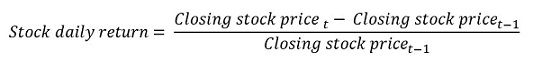

In [35]:
returns_df = sp500[['Date','sp500_Close']].copy() # creating a datafram with S&P500 Date and Closing Price

for i in lis:   # iterating over each stock dataframe
    
    if i!='technology_fb':     # inner joining all stock dataframes except FB dataframe with returns_df
        
        df1 = eval(i)[[ i[i.rfind('_')+1:]+'_Date', i[i.rfind('_')+1:]+'_Close']].copy()      # creating a temporary datframe df1 with only the Date and Cloing Price columns of a particular stock  
        returns_df = returns_df.merge(df1, left_on=returns_df.Date, right_on= df1[ i[i.rfind('_')+1:]+'_Date' ])      # merging returns_df and df1 wrt Date columns
        returns_df.drop(columns= 'key_0', axis = 1, inplace=True) # dropping 'Key_0' column
        
    else:     # as FB stock has 2 years of data missing using outer join to merge it woth returns_df
        
        df1 = eval(i)[[ i[i.rfind('_')+1:]+'_Date', i[i.rfind('_')+1:]+'_Close']].copy()       # creating a temporary datframe df1 with only the Date and Cloing Price columns of a particular stock  
        returns_df = returns_df.merge(df1, how='outer', left_on = returns_df.Date, right_on = df1[ i[i.rfind('_')+1:]+'_Date' ])      # merging returns_df and df1 wrt Date columns
        returns_df.drop(columns= 'key_0', axis = 1, inplace=True) # dropping 'Key_0' column

In [36]:
returns_df.head()

,Date,sp500_Close,aal_Date,aal_Close,algt_Date,algt_Close,alk_Date,alk_Close,dal_Date,dal_Close,ha_Date,ha_Close,luv_Date,luv_Close,bcs_Date,bcs_Close,cs_Date,cs_Close,db_Date,db_Close,gs_Date,gs_Close,ms_Date,ms_Close,wfc_Date,wfc_Close,bhc_Date,bhc_Close,jnj_Date,jnj_Close,mrk_Date,mrk_Close,pfe_Date,pfe_Close,rhhby_Date,rhhby_Close,unh_Date,unh_Close,aapl_Date,aapl_Close,amzn_Date,amzn_Close,fb_Date,fb_Close,goog_Date,goog_Close,ibm_Date,ibm_Close,msft_Date,msft_Close
0,2010-10-01,1146.239990,2010-10-01,9.29,2010-10-01,43.230000,2010-10-01,12.4475,2010-10-01,12.01,2010-10-01,5.96,2010-10-01,12.94,2010-10-01,17.603687,2010-10-01,42.226563,2010-10-01,52.595421,2010-10-01,147.699997,2010-10-01,25.020000,2010-10-01,25.559999,2010-10-01,25.750000,2010-10-01,61.750000,2010-10-01,36.599998,2010-10-01,17.180000,2010-10-01,17.389999,2010-10-01,35.430000,2010-10-01,10.090000,2010-10-01,153.710007,NaT,NaN,2010-10-01,261.828613,2010-10-01,135.639999,2010-10-01,24.379999
1,2010-10-04,1137.030029,2010-10-04,9.12,2010-10-04,41.590000,2010-10-04,12.1425,2010-10-04,11.51,2010-10-04,5.75,2010-10-04,12.82,2010-10-04,17.502304,2010-10-04,41.914063,2010-10-04,51.755726,2010-10-04,146.570007,2010-10-04,24.709999,2010-10-04,25.379999,2010-10-04,25.870001,2010-10-04,61.669998,2010-10-04,36.520000,2010-10-04,16.900000,2010-10-04,17.275000,2010-10-04,34.540001,2010-10-04,9.951428,2010-10-04,155.389999,NaT,NaN,2010-10-04,260.199707,2010-10-04,135.250000,2010-10-04,23.910000
2,2010-10-05,1160.750000,2010-10-05,9.23,2010-10-05,42.099998,2010-10-05,12.2150,2010-10-05,11.83,2010-10-05,5.85,2010-10-05,13.02,2010-10-05,18.156683,2010-10-05,43.154297,2010-10-05,53.950382,2010-10-05,149.570007,2010-10-05,25.469999,2010-10-05,26.250000,2010-10-05,26.299999,2010-10-05,62.799999,2010-10-05,37.020000,2010-10-05,17.230000,2010-10-05,17.799999,2010-10-05,35.070000,2010-10-05,10.319285,2010-10-05,160.869995,NaT,NaN,2010-10-05,268.110046,2010-10-05,137.660004,2010-10-05,24.350000
3,2010-10-06,1159.969971,2010-10-06,9.23,2010-10-06,41.950001,2010-10-06,12.1875,2010-10-06,11.78,2010-10-06,5.97,2010-10-06,12.94,2010-10-06,17.944700,2010-10-06,43.437500,2010-10-06,54.608780,2010-10-06,150.839996,2010-10-06,25.379999,2010-10-06,26.299999,2010-10-06,26.690001,2010-10-06,63.209999,2010-10-06,37.009998,2010-10-06,17.260000,2010-10-06,17.975000,2010-10-06,33.950001,2010-10-06,10.328215,2010-10-06,155.399994,NaT,NaN,2010-10-06,266.177307,2010-10-06,137.839996,2010-10-06,24.430000
4,2010-10-07,1158.060059,2010-10-07,9.24,2010-10-07,41.700001,2010-10-07,11.6250,2010-10-07,11.77,2010-10-07,6.15,2010-10-07,12.88,2010-10-07,17.253456,2010-10-07,43.671875,2010-10-07,54.036259,2010-10-07,151.110001,2010-10-07,25.070000,2010-10-07,26.000000,2010-10-07,26.600000,2010-10-07,63.220001,2010-10-07,36.709999,2010-10-07,17.379999,2010-10-07,17.930000,2010-10-07,34.340000,2010-10-07,10.329286,2010-10-07,156.270004,NaT,NaN,2010-10-07,264.015411,2010-10-07,138.720001,2010-10-07,24.530001


###### Calculating Daily returns

In [37]:
for i in returns_df:
    
    if '_Date' in i and i!='Date':     # dropping all Date columns except the 1st Date column in returns_df
        returns_df.drop(i, axis=1, inplace=True)
        
    elif '_Close' in i:       # calculating Daily return percentage of Closing stock price
        returns_df[i] = returns_df[i].pct_change(1)
        returns_df.rename(columns={i: str(i[:i.find('_')]+ '_pct_change')}, inplace=True)    # renaming column name
                                # e.g.  algt_Close will be renamed as algt_pct_change  
        
returns_df.dropna(axis=0, how='all',inplace=True, thresh=3)  # dropping the 1st row as it will have nan values

In [38]:
returns_df.head()

,Date,sp500_pct_change,aal_pct_change,algt_pct_change,alk_pct_change,dal_pct_change,ha_pct_change,luv_pct_change,bcs_pct_change,cs_pct_change,db_pct_change,gs_pct_change,ms_pct_change,wfc_pct_change,bhc_pct_change,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,goog_pct_change,ibm_pct_change,msft_pct_change
1,2010-10-04,-0.008035,-0.018299,-0.037937,-0.024503,-0.041632,-0.035235,-0.009274,-0.005759,-0.007401,-0.015965,-0.007651,-0.012390,-0.007042,0.004660,-0.001296,-0.002186,-0.016298,-0.006613,-0.025120,-0.013734,0.010930,NaN,-0.006221,-0.002875,-0.019278
2,2010-10-05,0.020861,0.012061,0.012263,0.005971,0.027802,0.017391,0.015601,0.037388,0.029590,0.042404,0.020468,0.030757,0.034279,0.016621,0.018323,0.013691,0.019527,0.030391,0.015344,0.036965,0.035266,NaN,0.030401,0.017819,0.018402
3,2010-10-06,-0.000672,0.000000,-0.003563,-0.002251,-0.004227,0.020513,-0.006144,-0.011675,0.006563,0.012204,0.008491,-0.003534,0.001905,0.014829,0.006529,-0.000270,0.001741,0.009832,-0.031936,0.000865,-0.034003,NaN,-0.007209,0.001308,0.003285
4,2010-10-07,-0.001647,0.001083,-0.005959,-0.046154,-0.000849,0.030151,-0.004637,-0.038521,0.005396,-0.010484,0.001790,-0.012214,-0.011407,-0.003372,0.000158,-0.008106,0.006952,-0.002503,0.011487,0.000104,0.005599,NaN,-0.008122,0.006384,0.004093
5,2010-10-08,0.006122,-0.018398,-0.046043,0.036344,-0.031436,0.000000,0.012422,0.011752,-0.015653,-0.003002,0.010257,0.009972,-0.001923,0.009023,0.000158,0.005448,0.004603,0.010876,0.000291,0.016769,-0.004607,NaN,0.011962,0.000937,0.001631


###### Creating a final dataframe with all stocks included with s&p500 index

In [39]:
all_stocks_df = sp500.copy()   # deep copying sp500 dataframe to a new dataframe to merge every other stock dataframe using date columns 

for i in lis: 
    
    if i!='technology_fb':   # inner joining all stock dataframes except FB dataframe as it has about 2 years of data missing
        df1 = eval(i).copy()
        all_stocks_df = all_stocks_df.merge(df1, how = 'inner', left_on=all_stocks_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        all_stocks_df.drop(columns= 'key_0', axis = 1, inplace=True)
        
    else:                        # outer joining all_stocks_df and fb stock dataframe
        df1 = eval(i).copy()
        all_stocks_df = all_stocks_df.merge(df1, how = 'outer', left_on=all_stocks_df.Date , right_on=df1[i[i.rfind('_')+1:] + '_Date'])    
        all_stocks_df.drop(columns= 'key_0', axis = 1, inplace=True)

In [40]:
len(all_stocks_df)

2517

In [41]:
# understanding statistical summary of all_stocks_df
all_stocks_df.describe(datetime_is_numeric=True)

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aal_Date,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume,algt_Date,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume,alk_Date,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume,dal_Date,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume,ha_Date,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume,luv_Date,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume,bcs_Date,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume,cs_Date,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume,db_Date,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume,gs_Date,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume,ms_Date,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume,wfc_Date,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume,bhc_Date,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume,jnj_Date,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume,mrk_Date,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume,pfe_Date,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume,rhhby_Date,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume,unh_Date,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume,aapl_Date,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume,amzn_Date,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume,fb_Date,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume,goog_Date,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume,ibm_Date,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume,msft_Date,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
count,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2106,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2.106000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03
mean,2015-10-01 13:47:16.233611520,2110.972959,2121.516622,2099.447811,2111.392732,2111.392732,3.739228e+09,2015-10-01 13:47:16.233611520,29.419932,29.893743,28.932447,29.397636,28.332638,1.263146e+07,2015-10-01 13:47:16.233611520,119.760942,121.616369,117.876146,119.742177,111

In [42]:
# printing summary of all_stocks_df
all_stocks_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 175 columns):
 #    Column           Dtype         
---   ------           -----         
 0    Date             datetime64[ns]
 1    sp500_Open       float64       
 2    sp500_High       float64       
 3    sp500_Low        float64       
 4    sp500_Close      float64       
 5    sp500_Adj Close  float64       
 6    sp500_Volume     int64         
 7    aal_Date         datetime64[ns]
 8    aal_Open         float64       
 9    aal_High         float64       
 10   aal_Low          float64       
 11   aal_Close        float64       
 12   aal_Adj Close    float64       
 13   aal_Volume       int32         
 14   algt_Date        datetime64[ns]
 15   algt_Open        float64       
 16   algt_High        float64       
 17   algt_Low         float64       
 18   algt_Close       float64       
 19   algt_Adj Close   float64       
 20   algt_Volume      int32         
 21   alk_Date    

###### checking start and end date of each stocks in all_stocks_df

In [43]:
for i in all_stocks_df:
    if all_stocks_df[i].dtype == '<M8[ns]':
        print(i, f"min_date-{all_stocks_df[i].min()} \t max_date-{all_stocks_df[i].max()}", sep = '\t')

Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
aal_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
algt_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
alk_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
dal_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
ha_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
luv_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
bcs_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
cs_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
db_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
gs_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
ms_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
wfc_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
bhc_Date	min_date-2010-10-01 00:00:00 	 max_date-2020-09-30 00:00:00
jnj_Date	min_date-2010-10-01 00:00:00 	 ma

In [44]:
# dropping all date columns except 1st Date column
date_cols = []
for i in all_stocks_df:
    if '_Date' in i:
        date_cols.append(i)
all_stocks_df.drop(columns=date_cols, axis=1, inplace=True)

In [45]:
all_stocks_df.head()

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000,9.29,9.39,9.21,9.29,8.758067,3603800,42.779999,43.259998,41.869999,43.230000,36.766212,159100,12.9325,12.9625,12.3675,12.4475,10.972344,1663600,11.75,12.01,11.71,12.01,10.668407,9094900,6.02,6.05,5.88,5.96,5.742526,645400,13.23,13.24,12.92,12.94,12.018754,5722500,17.585253,17.631336,17.382488,17.603687,13.351167,3083200,41.835938,42.285156,41.562500,42.226563,30.167257,1814900,52.585876,52.862595,52.003819,52.595421,44.981487,2010600,145.199997,148.500000,144.820007,147.699997,127.147858,7439800,24.930000,25.200001,24.680000,25.020000,20.962959,16292200,25.299999,25.690001,25.120001,25.559999,19.105776,32117900,25.120001,25.879999,25.100000,25.750000,24.757708,5778700,62.090000,62.250000,61.570000,61.750000,45.970119,9773200,36.759998,36.840000,36.349998,36.599998,26.052284,11741900,17.250000,17.290001,17.110001,17.180000,11.900640,35520800,17.200001,17.450001,17.190001,17.389999,10.770474,1405600,35.070000,35.470001,34.759998,35.430000,30.229097,6503500,10.219643,10.235000,10.048214,10.090000,8.719163,448142800,157.080002,157.440002,152.199997,153.710007,153.710007,8683400,NaN,NaN,NaN,NaN,NaN,NaN,264.010437,264.319275,260.523499,261.828613,261.828613,4466600,135.509995,136.279999,135.089996,135.639999,97.152512,5621200,24.770000,24.820000,24.299999,24.379999,19.315863,62672300
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000,9.24,9.48,9.05,9.12,8.597802,3856800,43.250000,43.330002,41.310001,41.590000,35.371429,189700,12.4300,12.5900,11.9975,12.1425,10.703489,1512400,11.70,12.01,11.45,11.51,10.224259,7916400,5.96,6.00,5.73,5.75,5.540189,618900,12.92,13.09,12.62,12.82,11.907295,6537700,17.603687,17.741936,17.336405,17.502304,13.274275,1362300,42.265625,42.431641,41.582031,41.914063,29.943998,1085600,52.204197,52.604961,51.412212,51.755726,44.263348,1245600,147.699997,148.470001,144.699997,146.570007,126.175117,5866700,24.959999,25.219999,24.549999,24.709999,20.703226,11955800,25.510000,25.790001,25.219999,25.379999,18.971230,25645400,25.750000,25.990000,25.590000,25.870001,24.873083,4187200,61.540001,61.980000,61.299999,61.669998,45.910553,8703600,36.490002,36.750000,36.290001,36.520000,25.995331,9234900,17.100000,17.200001,16.860001,16.900000,11.706684,40665800,17.305000,17.344999,17.225000,17.275000,10.699248,453600,35.299999,35.299999,34.349998,34.540001,29.469746,5883300,10.057143,10.1035

In [46]:
# checking for any null values
all_stocks_df.isnull().sum()

Date                 0
sp500_Open           0
sp500_High           0
sp500_Low            0
sp500_Close          0
sp500_Adj Close      0
sp500_Volume         0
aal_Open             0
aal_High             0
aal_Low              0
aal_Close            0
aal_Adj Close        0
aal_Volume           0
algt_Open            0
algt_High            0
algt_Low             0
algt_Close           0
algt_Adj Close       0
algt_Volume          0
alk_Open             0
alk_High             0
alk_Low              0
alk_Close            0
alk_Adj Close        0
alk_Volume           0
dal_Open             0
dal_High             0
dal_Low              0
dal_Close            0
dal_Adj Close        0
dal_Volume           0
ha_Open              0
ha_High              0
ha_Low               0
ha_Close             0
ha_Adj Close         0
ha_Volume            0
luv_Open             0
luv_High             0
luv_Low              0
luv_Close            0
luv_Adj Close        0
luv_Volume           0
bcs_Open   

<b><h3>We only need last 5 years data</h3><br><h4>So subsetting `all_stocks_df` and `returns_df`</h4></b> 

In [47]:
# saving the historics data for further analysis of peak prices
all_stocks_historic = all_stocks_df.copy()

In [48]:
# chosing the value closest to the middle-most date which is 2015-09-30 
for i in ['all_stocks_df', 'returns_df']:
    exec(f"{i} = eval(i)[eval(i)['Date']>='2015-10-01']")  # filtering and keeping only rows having date>=2015-10-01   
    
    print('\033[94m'+'-------------------'*2, end='')
    print('\033[1m' + i, end='')
    print('\033[0m'+'\033[94m'+'-------------------'*2+'\033[0m')
    display(eval(i).head())      # displaying head 

--------------------------------------all_stocks_df--------------------------------------


,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
1258,2015-10-01,1919.650024,1927.209961,1900.699951,1923.819946,1923.819946,3983600000,38.500000,39.270000,37.840000,39.200001,37.380684,9175100,215.360001,219.979996,212.300003,217.979996,199.048752,124000,78.879997,80.489998,78.000000,80.230003,73.762680,1230100,44.709999,45.500000,44.139999,45.410000,41.162464,8096500,24.600000,24.959999,24.120001,24.730000,23.827629,844900,37.820000,38.459999,37.560001,38.410000,36.664680,6147600,15.06,15.11,14.82,15.01,12.914361,2497700,24.240000,24.320000,23.870001,24.090000,19.528463,1152900,26.650000,26.740000,26.209999,26.520000,25.502949,3254600,174.399994,176.169998,173.039993,176.020004,161.868912,3613000,31.420000,31.809999,31.020000,31.500000,27.911953,13358700,51.509998,51.860001,50.919998,51.439999,43.422379,15556600,177.089996,180.000000,171.710007,179.600006,179.600006,6384100,93.430000,93.849998,91.760002,93.169998,81.377563,9675900,49.349998,49.570000,48.540001,49.369999,42.448627,14408600,31.299999,31.870001,31.100000,31.840000,26.459454,29950600,33.230000,33.279999,32.799999,33.220001,28.234310,1287600,115.940002,116.709999,114.910004,116.610001,107.703773,3768300,27.267500,27.405001,26.827499,27.395000,25.316107,255716400,511.000000,520.799988,506.000000,520.719971,520.719971,3768500,90.050003,90.949997,88.360001,90.949997,90.949997,29283700.0,608.369995,612.090027,599.849976,611.289978,611.289978,1867600,145.309998,145.669998,141.589996,143.589996,114.986984,3880900,44.750000,44.750000,43.750000,44.610001,40.541351,28657900
1259,2015-10-02,1921.770020,1951.359985,1893.699951,1951.359985,1951.359985,4378570000,38.750000,38.770000,37.419998,38.630001,36.837154,12276300,216.300003,220.460007,210.550003,215.589996,196.866318,107700,79.019997,79.370003,77.209999,79.260002,72.870872,1207900,44.939999,44.939999,43.349998,44.869999,40.672966,10918900,24.490000,24.490000,23.770000,24.280001,23.394051,729500,37.939999,38.389999,37.000000,38.380001,36.636047,7016100,14.98,15.39,14.86,15.39,13.241305,2775900,24.330000,24.639999,24.230000,24.639999,19.974319,2076900,26.719999,27.150000,26.629999,27.139999,26.099171,2982700,172.139999,177.100006,169.869995,177.009995,162.779297,4469900,30.400000,31.469999,30.150000,31.430000,27.849924,22822500,50.279999,51.290001,49.509998,51.259998,43.270424,21630300,170.229996,182.639999,164.270004,182.320007,182.320007,7697300,92.139999,93.970001,91.839996,93.930000,82.041382,8368100,48.790001,50.150002,48.349998,50.139999,43.11

--------------------------------------returns_df--------------------------------------


,Date,sp500_pct_change,aal_pct_change,algt_pct_change,alk_pct_change,dal_pct_change,ha_pct_change,luv_pct_change,bcs_pct_change,cs_pct_change,db_pct_change,gs_pct_change,ms_pct_change,wfc_pct_change,bhc_pct_change,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,goog_pct_change,ibm_pct_change,msft_pct_change
1258,2015-10-01,0.001974,0.009529,0.008000,0.009818,0.012035,0.002026,0.009727,0.015562,0.002497,-0.016320,0.013006,0.000000,0.001753,0.006839,-0.001928,-0.000405,0.013690,0.008194,0.005172,-0.006528,0.017250,0.011680,0.004717,-0.009519,0.007908
1259,2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
1260,2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
1261,2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
1262,2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069


### <b>Calculating Daily Relative Strenght Index</b>

In [49]:
for i in all_stocks_df:
    if '_Close' in i: 
        pos = all_stocks_df.columns.tolist().index(i)+1   # storing position of column so to insert RSI columns in all_stocks_df   
        all_stocks_df.insert(pos, i[:i.find('_')+1]+'RSI', all_stocks_df[i]/all_stocks_df['sp500_Close'],    # inserting RSI of every stock beside its closing price column     
                            allow_duplicates=True)

In [50]:
all_stocks_df.head()

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_RSI,sp500_Adj Close,sp500_Volume,aal_Open,aal_High,aal_Low,aal_Close,aal_RSI,aal_Adj Close,aal_Volume,algt_Open,algt_High,algt_Low,algt_Close,algt_RSI,algt_Adj Close,algt_Volume,alk_Open,alk_High,alk_Low,alk_Close,alk_RSI,alk_Adj Close,alk_Volume,dal_Open,dal_High,dal_Low,dal_Close,dal_RSI,dal_Adj Close,dal_Volume,ha_Open,ha_High,ha_Low,ha_Close,ha_RSI,ha_Adj Close,ha_Volume,luv_Open,luv_High,luv_Low,luv_Close,luv_RSI,luv_Adj Close,luv_Volume,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_RSI,bcs_Adj Close,bcs_Volume,cs_Open,cs_High,cs_Low,cs_Close,cs_RSI,cs_Adj Close,cs_Volume,db_Open,db_High,db_Low,db_Close,db_RSI,db_Adj Close,db_Volume,gs_Open,gs_High,gs_Low,gs_Close,gs_RSI,gs_Adj Close,gs_Volume,ms_Open,ms_High,ms_Low,ms_Close,ms_RSI,ms_Adj Close,ms_Volume,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_RSI,wfc_Adj Close,wfc_Volume,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_RSI,bhc_Adj Close,bhc_Volume,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_RSI,jnj_Adj Close,jnj_Volume,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_RSI,mrk_Adj Close,mrk_Volume,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_RSI,pfe_Adj Close,pfe_Volume,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_RSI,rhhby_Adj Close,rhhby_Volume,unh_Open,unh_High,unh_Low,unh_Close,unh_RSI,unh_Adj Close,unh_Volume,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_RSI,aapl_Adj Close,aapl_Volume,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_RSI,amzn_Adj Close,amzn_Volume,fb_Open,fb_High,fb_Low,fb_Close,fb_RSI,fb_Adj Close,fb_Volume,goog_Open,goog_High,goog_Low,goog_Close,goog_RSI,goog_Adj Close,goog_Volume,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_RSI,ibm_Adj Close,ibm_Volume,msft_Open,msft_High,msft_Low,msft_Close,msft_RSI,msft_Adj Close,msft_Volume
1258,2015-10-01,1919.650024,1927.209961,1900.699951,1923.819946,1.0,1923.819946,3983600000,38.500000,39.270000,37.840000,39.200001,0.020376,37.380684,9175100,215.360001,219.979996,212.300003,217.979996,0.113306,199.048752,124000,78.879997,80.489998,78.000000,80.230003,0.041703,73.762680,1230100,44.709999,45.500000,44.139999,45.410000,0.023604,41.162464,8096500,24.600000,24.959999,24.120001,24.730000,0.012855,23.827629,844900,37.820000,38.459999,37.560001,38.410000,0.019965,36.664680,6147600,15.06,15.11,14.82,15.01,0.007802,12.914361,2497700,24.240000,24.320000,23.870001,24.090000,0.012522,19.528463,1152900,26.650000,26.740000,26.209999,26.520000,0.013785,25.502949,3254600,174.399994,176.169998,173.039993,176.020004,0.091495,161.868912,3613000,31.420000,31.809999,31.020000,31.500000,0.016374,27.911953,13358700,51.509998,51.860001,50.919998,51.439999,0.026738,43.422379,15556600,177.089996,180.000000,171.710007,179.600006,0.093356,179.600006,6384100,93.430000,93.849998,91.760002,93.169998,0.048430,81.377563,9675900,49.349998,49.570000,48.540001,49.369999,0.025662,42.448627,14408600,31.299999,31.870001,31.100000,31.840000,0.016550,26.459454,29950600,33.230000,33.279999,32.799999,33.220001,0.017268,28.234310,1287600,115.940002,116.709999,114.910004,116.610001,0.060614,107.703773,3768300,27.267500,27.405001,26.827499,27.395000,0.014240,25.316107,255716400,511.000000,520.799988,506.000000,520.719971,0.270670,520.719971,3768500,90.050003,90.949997,88.360001,90.949997,0.047276,90.949997,29283700.0,608.369995,612.090027,599.849976,611.289978,0.317748,611.289978,1867600,145.309998,145.669998,141.589996,143.589996,0.074638,114.986984,3880900,44.750000,44.750000,43.750000,44.610001,0.023188,40.541351,28657900
1259,2015-10-02,1921.770020,1951.359985,1893.699951,1951.359985,1.0,1951.359985,4378570000,38.750000,38.770000,37.419998,38.630001,0.019796,36.837154,12276300,216.300003,220.460007,210.550003,215.589996,0.110482,196.866318,107700,79.019997,79.370003,77.209999,79.260002,0.040618,72.870872,1207900,44.939999,44.939999,43.349998,44.869999,0.022994,40.672966,10918900,24.490000,24.490000,23.770000,24.280001,0.012443,23.394051,729500,37.939999,38.389999,37.000000,38.380001,0.019668,36.636047,7016100,14.98,15.39,14.86,15.39,

In [51]:
# creating list with only closing price column names from all_stocks_df
close_lis=[]
for i in all_stocks_df:
    if '_Close' in i or i=='Date' or i == 'Close':
        close_lis.append(i)
print(close_lis)

['Date', 'sp500_Close', 'aal_Close', 'algt_Close', 'alk_Close', 'dal_Close', 'ha_Close', 'luv_Close', 'bcs_Close', 'cs_Close', 'db_Close', 'gs_Close', 'ms_Close', 'wfc_Close', 'bhc_Close', 'jnj_Close', 'mrk_Close', 'pfe_Close', 'rhhby_Close', 'unh_Close', 'aapl_Close', 'amzn_Close', 'fb_Close', 'goog_Close', 'ibm_Close', 'msft_Close']


In [52]:
# creating list with only RSI column names from all_stocks_df
RSI_lis=[]
for i in all_stocks_df:
    if 'RSI' in i or i=='Date':
        RSI_lis.append(i)
print(RSI_lis)

['Date', 'sp500_RSI', 'aal_RSI', 'algt_RSI', 'alk_RSI', 'dal_RSI', 'ha_RSI', 'luv_RSI', 'bcs_RSI', 'cs_RSI', 'db_RSI', 'gs_RSI', 'ms_RSI', 'wfc_RSI', 'bhc_RSI', 'jnj_RSI', 'mrk_RSI', 'pfe_RSI', 'rhhby_RSI', 'unh_RSI', 'aapl_RSI', 'amzn_RSI', 'fb_RSI', 'goog_RSI', 'ibm_RSI', 'msft_RSI']


In [53]:
# creating list with only Volume column names from all_stocks_df
volume_lis=[]
for i in all_stocks_df:
    if '_Volume' in i or i=='Date' or i == 'Volume':
        volume_lis.append(i)
print(volume_lis)

['Date', 'sp500_Volume', 'aal_Volume', 'algt_Volume', 'alk_Volume', 'dal_Volume', 'ha_Volume', 'luv_Volume', 'bcs_Volume', 'cs_Volume', 'db_Volume', 'gs_Volume', 'ms_Volume', 'wfc_Volume', 'bhc_Volume', 'jnj_Volume', 'mrk_Volume', 'pfe_Volume', 'rhhby_Volume', 'unh_Volume', 'aapl_Volume', 'amzn_Volume', 'fb_Volume', 'goog_Volume', 'ibm_Volume', 'msft_Volume']


###### Creating Dataframes for closing prices, Volume and RSI of each stock 

In [54]:
close_price_df = all_stocks_df[close_lis]
volume_df = all_stocks_df[volume_lis]
RSI_df = all_stocks_df[RSI_lis]

In [55]:
close_price_df.head()

,Date,sp500_Close,aal_Close,algt_Close,alk_Close,dal_Close,ha_Close,luv_Close,bcs_Close,cs_Close,db_Close,gs_Close,ms_Close,wfc_Close,bhc_Close,jnj_Close,mrk_Close,pfe_Close,rhhby_Close,unh_Close,aapl_Close,amzn_Close,fb_Close,goog_Close,ibm_Close,msft_Close
1258,2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
1259,2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
1260,2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
1261,2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
1262,2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


In [56]:
volume_df.head()

,Date,sp500_Volume,aal_Volume,algt_Volume,alk_Volume,dal_Volume,ha_Volume,luv_Volume,bcs_Volume,cs_Volume,db_Volume,gs_Volume,ms_Volume,wfc_Volume,bhc_Volume,jnj_Volume,mrk_Volume,pfe_Volume,rhhby_Volume,unh_Volume,aapl_Volume,amzn_Volume,fb_Volume,goog_Volume,ibm_Volume,msft_Volume
1258,2015-10-01,3983600000,9175100,124000,1230100,8096500,844900,6147600,2497700,1152900,3254600,3613000,13358700,15556600,6384100,9675900,14408600,29950600,1287600,3768300,255716400,3768500,29283700.0,1867600,3880900,28657900
1259,2015-10-02,4378570000,12276300,107700,1207900,10918900,729500,7016100,2775900,2076900,2982700,4469900,22822500,21630300,7697300,8368100,24287900,41704700,1513000,3521600,232079200,4597800,37881700.0,2684800,3054400,41839000
1260,2015-10-05,4334490000,9421800,182100,1408800,8629300,1220600,5962500,3286900,1011600,2500100,3411900,11635700,15240700,11648200,9419200,15881600,31996500,1035300,3491200,208258800,3391400,27292500.0,1803600,5131800,34369300
1261,2015-10-06,4202400000,12985800,238200,2874800,9081000,972100,8334400,2398400,710600,1431900,1859100,8875100,14490700,7376100,8365200,16493500,36590300,814700,4652000,192787200,4502800,22172800.0,2166300,3018100,27017200
1262,2015-10-07,4666470000,10513700,172800,2894600,11737900,799900,7279800,2624400,1200300,2082800,2572200,13458400,13863500,4181600,9397300,14508200,28750100,2131300,4282000,187062400,3812100,24129300.0,2092700,2980800,27711500


In [57]:
RSI_df.head()

,Date,sp500_RSI,aal_RSI,algt_RSI,alk_RSI,dal_RSI,ha_RSI,luv_RSI,bcs_RSI,cs_RSI,db_RSI,gs_RSI,ms_RSI,wfc_RSI,bhc_RSI,jnj_RSI,mrk_RSI,pfe_RSI,rhhby_RSI,unh_RSI,aapl_RSI,amzn_RSI,fb_RSI,goog_RSI,ibm_RSI,msft_RSI
1258,2015-10-01,1.0,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965,0.007802,0.012522,0.013785,0.091495,0.016374,0.026738,0.093356,0.048430,0.025662,0.016550,0.017268,0.060614,0.014240,0.270670,0.047276,0.317748,0.074638,0.023188
1259,2015-10-02,1.0,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668,0.007887,0.012627,0.013908,0.090711,0.016107,0.026269,0.093432,0.048136,0.025695,0.016952,0.017075,0.060896,0.014141,0.272907,0.047182,0.321268,0.074092,0.023353
1260,2015-10-05,1.0,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778,0.007851,0.012662,0.014192,0.090939,0.016250,0.026376,0.082263,0.047689,0.025782,0.016849,0.016829,0.060215,0.013938,0.273612,0.047311,0.322825,0.075006,0.023467
1261,2015-10-06,1.0,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193,0.007854,0.012819,0.014344,0.091074,0.016344,0.026279,0.083842,0.047184,0.025153,0.016561,0.016935,0.058613,0.014055,0.271465,0.046871,0.325993,0.075144,0.023612
1262,2015-10-07,1.0,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395,0.007881,0.012686,0.014425,0.091305,0.016499,0.026150,0.085092,0.047589,0.025528,0.016680,0.016309,0.058337,0.013876,0.271536,0.046297,0.321851,0.075202,0.023449


### <b>Normalizing closing price </b>

In [58]:
normalized_close_price = pd.DataFrame(close_price_df.Date) # creating a new dataframe containing only date column from close_price_df

for i in close_price_df.columns[1:]: # iterating over every column except Date column
    normalized_close_price[i] = close_price_df[i]/close_price_df[i].iloc[0]
    # normalized closing price = ith closing price / 1st closing price

In [59]:
normalized_close_price.head()

,Date,sp500_Close,aal_Close,algt_Close,alk_Close,dal_Close,ha_Close,luv_Close,bcs_Close,cs_Close,db_Close,gs_Close,ms_Close,wfc_Close,bhc_Close,jnj_Close,mrk_Close,pfe_Close,rhhby_Close,unh_Close,aapl_Close,amzn_Close,fb_Close,goog_Close,ibm_Close,msft_Close
1258,2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1259,2015-10-02,1.014315,0.985459,0.989036,0.987910,0.988108,0.981804,0.999219,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038,1.007301,1.022699,1.012314,1.025553,1.006895,1.021520
1260,2015-10-05,1.032867,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857,0.910134,1.017066,1.037675,1.051508,1.006622,1.026070,1.010951,1.044093,1.033645,1.049371,1.037955,1.045281
1261,2015-10-06,1.029161,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198,1.015788,1.032186,1.020341,1.055866,1.036145,1.047971
1262,2015-10-07,1.037431,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456,1.010951,1.040751,1.015943,1.050827,1.045268,1.049092


In [60]:
normalized_close_price.describe()

,sp500_Close,aal_Close,algt_Close,alk_Close,dal_Close,ha_Close,luv_Close,bcs_Close,cs_Close,db_Close,gs_Close,ms_Close,wfc_Close,bhc_Close,jnj_Close,mrk_Close,pfe_Close,rhhby_Close,unh_Close,aapl_Close,amzn_Close,fb_Close,goog_Close,ibm_Close,msft_Close
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000
mean,1.355860,0.928417,0.663928,0.832961,1.061911,1.426501,1.289275,0.620615,0.586583,0.512571,1.178504,1.354100,0.953297,0.155166,1.385113,1.377944,1.139787,1.008767,1.827675,1.718569,2.740418,1.798913,1.702610,1.000451,2.290632
std,0.205185,0.293035,0.114260,0.191374,0.206526,0.458989,0.229963,0.145714,0.134469,0.200711,0.179518,0.274931,0.178161,0.139168,0.146557,0.233967,0.119812,0.140406,0.509643,0.766308,1.283531,0.440305,0.395231,0.105605,1.025743
min,0.950754,0.230612,0.303835,0.293656,0.422594,0.348969,0.621453,0.255829,0.276878,0.206637,0.766788,0.688571,0.437986,0.047383,1.000000,0.984201,0.894786,0.794401,0.936712,0.824420,0.925776,1.000000,1.000000,0.660004,1.000000
25%,1.177077,0.774490,0.596729,0.768229,0.997027,1.124343,1.104270,0.540306,0.497924,0.327866,1.040649,1.213492,0.920004,0.093708,1.284104,1.188171,1.051036,0.922035,1.376983,1.088565,1.571132,1.420011,1.304553,0.935476,1.404618
50%,1.380743,0.968112,0.660611,0.824505,1.108566,1.492115,1.350690,0.621586,0.570361,0.507919,1.191115,1.397460,0.994168,0.123441,1.405817,1.298157,1.123430,0.964479,1.943573,1.568261,2.880627,1.838813,1.727184,1.004527,2.105357
75%,1.501318,1.150638,0.745894,0.944347,1.205571,1.732511,1.456261,0.718188,0.643421,0.657617,1.316157,1.553810,1.061042,0.141954,1.497209,1.607859,1.203832,1.037628,2.227510,1.966372,3.512041,2.054920,1.957238,1.068459,3.031159
max,1.861318,1.491582,1.045325,1.249408,1.390883,2.438334,1.725853,1.053298,1.077626,1.159502,1.553119,1.870159,1.281687,1.015145,1.669099,1.864290,1.451947,1.409994,2.775920,4.897974,6.781860,3.341506,2.827267,1.267150,5.192782


### <b>Data Visualisation and Trend Analysis</b>

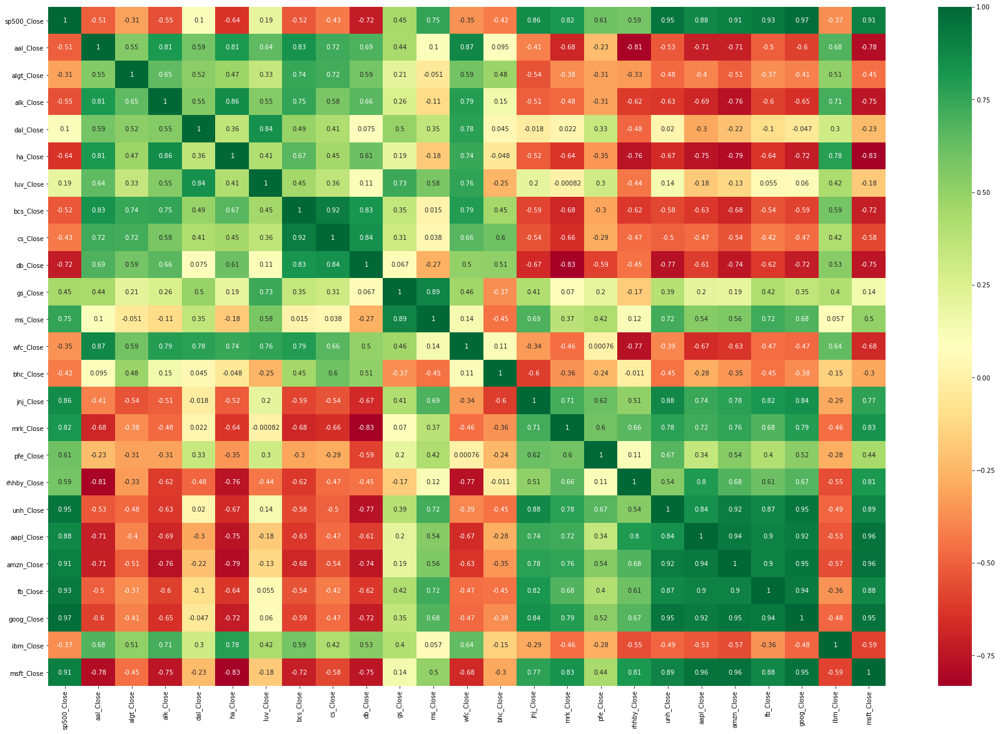

In [61]:
plt.figure(figsize=[30,20])
sns.heatmap(normalized_close_price[normalized_close_price.columns.tolist()[1:]].corr(), annot=True, cmap='RdYlGn')
plt.show()

<h3><b>Insight</b></h3><hr>

* Stocks in Technology sector all have very high positive correlation with S&P500 except IBM
* Most stocks of Aviation and Finance sectors have moderate to high Negative correlation with S&P500
* Stocks GS and MS have moderate and high positive correlation with S&P500 
* All stocks in Pharma_Healthcare sector have moderate to high positive correlation with S&P500 except
BHC

In [62]:
all_stocks_historic.head()

,Date,sp500_Open,sp500_High,sp500_Low,sp500_Close,sp500_Adj Close,sp500_Volume,aal_Open,aal_High,aal_Low,aal_Close,aal_Adj Close,aal_Volume,algt_Open,algt_High,algt_Low,algt_Close,algt_Adj Close,algt_Volume,alk_Open,alk_High,alk_Low,alk_Close,alk_Adj Close,alk_Volume,dal_Open,dal_High,dal_Low,dal_Close,dal_Adj Close,dal_Volume,ha_Open,ha_High,ha_Low,ha_Close,ha_Adj Close,ha_Volume,luv_Open,luv_High,luv_Low,luv_Close,luv_Adj Close,luv_Volume,bcs_Open,bcs_High,bcs_Low,bcs_Close,bcs_Adj Close,bcs_Volume,cs_Open,cs_High,cs_Low,cs_Close,cs_Adj Close,cs_Volume,db_Open,db_High,db_Low,db_Close,db_Adj Close,db_Volume,gs_Open,gs_High,gs_Low,gs_Close,gs_Adj Close,gs_Volume,ms_Open,ms_High,ms_Low,ms_Close,ms_Adj Close,ms_Volume,wfc_Open,wfc_High,wfc_Low,wfc_Close,wfc_Adj Close,wfc_Volume,bhc_Open,bhc_High,bhc_Low,bhc_Close,bhc_Adj Close,bhc_Volume,jnj_Open,jnj_High,jnj_Low,jnj_Close,jnj_Adj Close,jnj_Volume,mrk_Open,mrk_High,mrk_Low,mrk_Close,mrk_Adj Close,mrk_Volume,pfe_Open,pfe_High,pfe_Low,pfe_Close,pfe_Adj Close,pfe_Volume,rhhby_Open,rhhby_High,rhhby_Low,rhhby_Close,rhhby_Adj Close,rhhby_Volume,unh_Open,unh_High,unh_Low,unh_Close,unh_Adj Close,unh_Volume,aapl_Open,aapl_High,aapl_Low,aapl_Close,aapl_Adj Close,aapl_Volume,amzn_Open,amzn_High,amzn_Low,amzn_Close,amzn_Adj Close,amzn_Volume,fb_Open,fb_High,fb_Low,fb_Close,fb_Adj Close,fb_Volume,goog_Open,goog_High,goog_Low,goog_Close,goog_Adj Close,goog_Volume,ibm_Open,ibm_High,ibm_Low,ibm_Close,ibm_Adj Close,ibm_Volume,msft_Open,msft_High,msft_Low,msft_Close,msft_Adj Close,msft_Volume
0,2010-10-01,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000,9.29,9.39,9.21,9.29,8.758067,3603800,42.779999,43.259998,41.869999,43.230000,36.766212,159100,12.9325,12.9625,12.3675,12.4475,10.972344,1663600,11.75,12.01,11.71,12.01,10.668407,9094900,6.02,6.05,5.88,5.96,5.742526,645400,13.23,13.24,12.92,12.94,12.018754,5722500,17.585253,17.631336,17.382488,17.603687,13.351167,3083200,41.835938,42.285156,41.562500,42.226563,30.167257,1814900,52.585876,52.862595,52.003819,52.595421,44.981487,2010600,145.199997,148.500000,144.820007,147.699997,127.147858,7439800,24.930000,25.200001,24.680000,25.020000,20.962959,16292200,25.299999,25.690001,25.120001,25.559999,19.105776,32117900,25.120001,25.879999,25.100000,25.750000,24.757708,5778700,62.090000,62.250000,61.570000,61.750000,45.970119,9773200,36.759998,36.840000,36.349998,36.599998,26.052284,11741900,17.250000,17.290001,17.110001,17.180000,11.900640,35520800,17.200001,17.450001,17.190001,17.389999,10.770474,1405600,35.070000,35.470001,34.759998,35.430000,30.229097,6503500,10.219643,10.235000,10.048214,10.090000,8.719163,448142800,157.080002,157.440002,152.199997,153.710007,153.710007,8683400,NaN,NaN,NaN,NaN,NaN,NaN,264.010437,264.319275,260.523499,261.828613,261.828613,4466600,135.509995,136.279999,135.089996,135.639999,97.152512,5621200,24.770000,24.820000,24.299999,24.379999,19.315863,62672300
1,2010-10-04,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000,9.24,9.48,9.05,9.12,8.597802,3856800,43.250000,43.330002,41.310001,41.590000,35.371429,189700,12.4300,12.5900,11.9975,12.1425,10.703489,1512400,11.70,12.01,11.45,11.51,10.224259,7916400,5.96,6.00,5.73,5.75,5.540189,618900,12.92,13.09,12.62,12.82,11.907295,6537700,17.603687,17.741936,17.336405,17.502304,13.274275,1362300,42.265625,42.431641,41.582031,41.914063,29.943998,1085600,52.204197,52.604961,51.412212,51.755726,44.263348,1245600,147.699997,148.470001,144.699997,146.570007,126.175117,5866700,24.959999,25.219999,24.549999,24.709999,20.703226,11955800,25.510000,25.790001,25.219999,25.379999,18.971230,25645400,25.750000,25.990000,25.590000,25.870001,24.873083,4187200,61.540001,61.980000,61.299999,61.669998,45.910553,8703600,36.490002,36.750000,36.290001,36.520000,25.995331,9234900,17.100000,17.200001,16.860001,16.900000,11.706684,40665800,17.305000,17.344999,17.225000,17.275000,10.699248,453600,35.299999,35.299999,34.349998,34.540001,29.469746,5883300,10.057143,10.1035

#### <b><font color='dodgerblue'>Closing Price from 2010</font></b>

In [63]:
fig = px.line(data_frame=all_stocks_historic, x='Date', y = [i for i in all_stocks_historic if '_Close' in i])
fig.show()

#### <b><font color='dodgerblue'>Closing price of each sectors from 2010 plotted separately</font><b> 

In [64]:
for i in sectors:
    fig = px.line(data_frame=eval(i), x='Date', y = [j for j in eval(i).columns if '_Close' in j],
                 title=i[:-3]+' sector')
    fig.show()

#### <b><font color='dodgerblue'>Closing Price</font></b>

In [65]:
fig = px.line(data_frame=close_price_df, x='Date', y=close_price_df.columns[1:])
fig.show()

In [66]:
for i in sectors:
    fig = px.line(data_frame=close_price_df, x='Date', y = [j for j in eval(i).columns if '_Close' in j],
                 title=i[:-3]+' sector')
    fig.show()

<h3><b>Insight</b></h3><hr>

* AMZN and GOOG stocks have clearly outperformed every other stock <br>


<b><em>Aviation</em></b>

* Aviation Industry has not been performing very well and after travel restrictions due to Pandemic, It has taken the worst hit
* <em>DAL</em> had shown a very weak up trend while others had shown either down or sideways trend<br>

<b><em>Finance</em></b>

* <em>WFC</em>, <em>BCS</em>, <em>CS</em>, <em>GS</em> and <em>DB</em> have shown slight down trend
* <em>MS</em> had show up trend from Feb 2016 to Mar 2018 where it reached its highest closing price of 58.91.
Then the price fell for a while and again increased upto 57.51 Jan 2020.
After it dropped drastically as lockdowns were imposed, the price has recovered upto 48.35<br>

<b><em>Pharma_Healthcare</em></b>

* <em>UNH</em>, <em>MRK</em>, <em>RHHBY</em> and <em>JNJ</em> have shown a good uptrend with <em>UNH</em> outperformimg every stock in Pharma_Healthcare sector.
* <em>RHHBY</em> had a slight downtrend from Oct 2015 to June 2016 but has been increasing since 
* The <em>PFE</em> stock price had a uptrend from Nov 2016 to Nov 2018 but has been declining since
* <em>BHC</em> had to pay $1.2 Billion in a lawsuit in 2015 due to which its price fell from 182.32 to 26.11 in just 6 months and hasen't been able to recover since<br>

<b><em>Technology</em></b>

* Except <em>IBM</em> every other stock in technology sector have performed well and has shown a up trend

#### <b><font color='dodgerblue'>Normalized Closing Price</font></b>

In [67]:
for i in sectors:
    fig = px.line(data_frame=normalized_close_price, x='Date', y = [j for j in eval(i).columns if '_Close' in j],
                 title=i[:-3]+' sector')
    fig.show()

<h3><b>Insight</b></h3><hr>



<b><em>Aviation</em></b>

* All stocks in aviation sector have underperformed and less than 1X return i.e. have inccured losses 

<b><em>Finance</em></b>

<em>MS</em> has given a similar X returns as that of S&P500

<b><em>Pharma_Healthcare</em></b>

* In last 5 years <em>UNH</em> gave more then 2X returns while S&P500 gave only about 1.7X 
* <em>MRK</em> and <em>JNJ</em> have given similar x returns as that of S&P500

<b><em>Technology</em></b>

* Except <em>IBM</em> every other stock in technology sector has given more then 2X returns 

### <b><font color='dodgerblue'>RSI</font></b>

In [68]:
RSI_df.head()

,Date,sp500_RSI,aal_RSI,algt_RSI,alk_RSI,dal_RSI,ha_RSI,luv_RSI,bcs_RSI,cs_RSI,db_RSI,gs_RSI,ms_RSI,wfc_RSI,bhc_RSI,jnj_RSI,mrk_RSI,pfe_RSI,rhhby_RSI,unh_RSI,aapl_RSI,amzn_RSI,fb_RSI,goog_RSI,ibm_RSI,msft_RSI
1258,2015-10-01,1.0,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965,0.007802,0.012522,0.013785,0.091495,0.016374,0.026738,0.093356,0.048430,0.025662,0.016550,0.017268,0.060614,0.014240,0.270670,0.047276,0.317748,0.074638,0.023188
1259,2015-10-02,1.0,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668,0.007887,0.012627,0.013908,0.090711,0.016107,0.026269,0.093432,0.048136,0.025695,0.016952,0.017075,0.060896,0.014141,0.272907,0.047182,0.321268,0.074092,0.023353
1260,2015-10-05,1.0,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778,0.007851,0.012662,0.014192,0.090939,0.016250,0.026376,0.082263,0.047689,0.025782,0.016849,0.016829,0.060215,0.013938,0.273612,0.047311,0.322825,0.075006,0.023467
1261,2015-10-06,1.0,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193,0.007854,0.012819,0.014344,0.091074,0.016344,0.026279,0.083842,0.047184,0.025153,0.016561,0.016935,0.058613,0.014055,0.271465,0.046871,0.325993,0.075144,0.023612
1262,2015-10-07,1.0,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395,0.007881,0.012686,0.014425,0.091305,0.016499,0.026150,0.085092,0.047589,0.025528,0.016680,0.016309,0.058337,0.013876,0.271536,0.046297,0.321851,0.075202,0.023449


In [69]:
for i in sectors:
    fig = px.line(data_frame=RSI_df, x='Date', y = [j[:j.find('_')]+'_RSI' for j in eval(i).columns if '_Close' in j],      
                 title=i[:-3]+' sector')
    fig.show()

<h3><b>Insight</b></h3><hr>



<b><em>Aviation</em></b>

* All stocks in aviation sector have shown downtrend indicating no stock has performed better than S&P500

<b><em>Finance</em></b>

* All stocks in Finance sector have shown downtrend indicating no stock has performed better than S&P500


<b><em>Pharma_Healthcare</em></b>

* <em>UNH</em> has shown a uptrend indicating it has performed better than the market index S&P500
* every other stock has shown a downtrend


<b><em>Technology</em></b>

* Except <em>IBM</em> every stock in Technology sector has shown uptrend indicating it has performed better than S&P500

#### <b><font color='dodgerblue'>Daily Returns</font></b>

In [70]:
returns_df.head()

,Date,sp500_pct_change,aal_pct_change,algt_pct_change,alk_pct_change,dal_pct_change,ha_pct_change,luv_pct_change,bcs_pct_change,cs_pct_change,db_pct_change,gs_pct_change,ms_pct_change,wfc_pct_change,bhc_pct_change,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,goog_pct_change,ibm_pct_change,msft_pct_change
1258,2015-10-01,0.001974,0.009529,0.008000,0.009818,0.012035,0.002026,0.009727,0.015562,0.002497,-0.016320,0.013006,0.000000,0.001753,0.006839,-0.001928,-0.000405,0.013690,0.008194,0.005172,-0.006528,0.017250,0.011680,0.004717,-0.009519,0.007908
1259,2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
1260,2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
1261,2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
1262,2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069


In [71]:
px.line(data_frame=returns_df, x='Date', y=returns_df.columns[1:])

In [72]:
for i in sectors:
    fig = px.line(data_frame=returns_df, x='Date', y = [j[:j.find('_')]+'_pct_change' for j in eval(i).columns if '_Close' in j],      
                 title=i[:-3]+' sector')
    fig.show()

<h3><b>Insight</b></h3><hr>

* Volatility of each stock increase in Pandemic due to lockdown restrictions
* <em>BHC</em>, <em>AAL</em>, <em>DB</em> and <em>HA</em> have been the most Volatile stocks

<b><em>Aviation</em></b>

* In aviation Sector <em>HA</em> was the most volatile stock while <em>LUV</em> was the least

<b><em>Finance</em></b>

* In Finance Sector <em>DB</em> was the most volatile stock while <em>GS</em> was the least


<b><em>Pharma_Healthcare</em></b>

* In Pharma_Healthcare Sector <em>BHC</em> was the most volatile stock while <em>PFE</em> and <em>RHHBY</em> was the least


<b><em>Technology</em></b>

* In Technology Sector <em>FB</em> was the most volatile stock while <em>IBM</em> was the least

## <b>Deriving Important Metrics</b>

#### <b><font color='dodgerblue'>Daily Average Returns & Annualized Returns</font></b>

In [73]:
returns_df.head()

,Date,sp500_pct_change,aal_pct_change,algt_pct_change,alk_pct_change,dal_pct_change,ha_pct_change,luv_pct_change,bcs_pct_change,cs_pct_change,db_pct_change,gs_pct_change,ms_pct_change,wfc_pct_change,bhc_pct_change,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,goog_pct_change,ibm_pct_change,msft_pct_change
1258,2015-10-01,0.001974,0.009529,0.008000,0.009818,0.012035,0.002026,0.009727,0.015562,0.002497,-0.016320,0.013006,0.000000,0.001753,0.006839,-0.001928,-0.000405,0.013690,0.008194,0.005172,-0.006528,0.017250,0.011680,0.004717,-0.009519,0.007908
1259,2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
1260,2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
1261,2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
1262,2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069


In [74]:
all_stock_stats = pd.DataFrame({'stock':[i[:i.find('_')] for i in returns_df.columns[1:]]})

In [75]:
all_stock_stats['avg_daily_returns'] = (returns_df.mean().values*100)
all_stock_stats['annualized_return_rate'] = (returns_df.mean().values * 252 *100)

In [76]:
all_stock_stats.sort_values('annualized_return_rate', ascending=False)

,stock,avg_daily_returns,annualized_return_rate
20,amzn,0.162296,40.898487
24,msft,0.139222,35.084018
19,aapl,0.131592,33.161069
21,fb,0.105814,26.665121
18,unh,0.094462,23.804408
22,goog,0.083719,21.097150
11,ms,0.057707,14.542055
0,sp500,0.051864,13.069808
15,mrk,0.051051,12.864847
14,jnj,0.044861,11.305044


<h3><b>Insight</b></h3><hr>

<b>The Top 10 Stocks having maximum Annualized return rate are</b><br>
1.AMZN (40.89%) <br>
2.MSFT (35.08%) <br>
3.AAPL (33.16%) <br>
4.FB (26.66%) <br>
5.UNH (23.08%) <br>
6.GOOG (21.09%) <br>
7.MS (14.54%) <br>
8.MRK (12.86%) <br>
9.JNJ (11.30%) <br>
10.GS (7.89%)


#### <b><font color='dodgerblue'>Daily Volatility/Risk & Annualized Volatility/Risk</font></b>
i.e. Standard Deviation

![03e2d26e-1f31-4f06-b552-adbefe6cb4d6-Capstone_Project_DA_BA%20%28Portfolio%29%20(1).jpg](attachment:03e2d26e-1f31-4f06-b552-adbefe6cb4d6-Capstone_Project_DA_BA%20%28Portfolio%29%20(1).jpg)
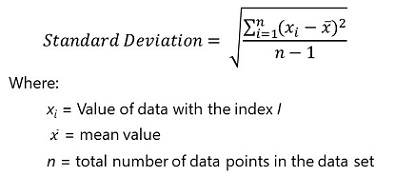

In [77]:
all_stock_stats['daily_volatility'] = returns_df.std()[1:].values * 100
all_stock_stats['annualized_volatility'] = returns_df.std()[1:].values * 252**0.5 * 100

In [78]:
all_stock_stats.sort_values('annualized_volatility').reset_index()

,index,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility
0,0,sp500,0.051864,13.069808,1.207533,19.168989
1,14,jnj,0.044861,11.305044,1.245428,19.770557
2,17,rhhby,0.029899,7.534502,1.351058,21.447381
3,16,pfe,0.021923,5.524649,1.382586,21.947874
4,15,mrk,0.051051,12.864847,1.406138,22.321745
5,23,ibm,-0.000928,-0.233786,1.608195,25.529298
6,22,goog,0.083719,21.097150,1.651418,26.215451
7,24,msft,0.139222,35.084018,1.753346,27.833508
8,18,unh,0.094462,23.804408,1.780371,28.262509
9,19,aapl,0.131592,33.161069,1.872309,29.721976


<h3><b>Insight</b></h3><hr>

<b>The Top 10 Stocks having Minimum Annualized Volatility excluding S&P500 are </b><br>
1.JNJ (19.77%) <br>
2.RHHBY (21.44%) <br>
3.PFE (21.94%) <br>
4.MRK (22.32%) <br>
5.IBM (25.52%) <br>
6.GOOG (26.21%) <br>
7.MSFT (27.83%) <br>
8.UNH (28.26%) <br>
9.AAPL (29.72%) <br>
10.AMZN (30.10%)


#### <b><font color='dodgerblue'>Cummulative return rate</font></b>

![2afd3740-2473-4176-8b12-93a5da0dd67e-Capstone_Project_DA_BA%20%28Portfolio%29%20(4).jpg](attachment:2afd3740-2473-4176-8b12-93a5da0dd67e-Capstone_Project_DA_BA%20%28Portfolio%29%20(4).jpg)
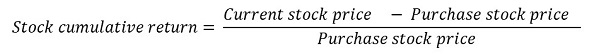

In [79]:
all_stock_stats['cummulative_return_rate'] = ((close_price_df.iloc[-1][1:] - close_price_df.iloc[0][1:])/close_price_df.iloc[0][1:] * 100).values

In [80]:
all_stock_stats.sort_values('cummulative_return_rate', ascending=False)

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate
20,amzn,0.162296,40.898487,1.896614,30.107821,504.68777
24,msft,0.139222,35.084018,1.753346,27.833508,371.486208
19,aapl,0.131592,33.161069,1.872309,29.721976,322.741369
21,fb,0.105814,26.665121,2.034832,32.301949,187.960421
18,unh,0.094462,23.804408,1.780371,28.262509,167.361278
22,goog,0.083719,21.097150,1.651418,26.215451,140.40963
0,sp500,0.051864,13.069808,1.207533,19.168989,74.808459
15,mrk,0.051051,12.864847,1.406138,22.321745,68.017012
14,jnj,0.044861,11.305044,1.245428,19.770557,59.793934
11,ms,0.057707,14.542055,2.180085,34.607776,53.492057


<h3><b>Insight</b></h3><hr>

<b>The Top 10 Stocks having maximum cummulative return rate are</b><br>
1.AMZN (504.68%) <br>
2.MSFT (371.48%) <br>
3.AAPL (322.74%) <br>
4.FB (187.96%) <br>
5.UNH (167.36%) <br>
6.GOOG (140.40%) <br>
7.MRK (68.01%) <br>
8.JNJ (59.79%) <br>
9.MS (53.49%) <br>
10.RHHBY (28.86%)


#### <b><font color='dodgerblue'>Sharpe Ratio</font></b>

![2f9c28c8-cb8c-429a-8955-b459a02f0928-Capstone_Project_DA_BA%20%28Portfolio%29%20(5).jpg](attachment:2f9c28c8-cb8c-429a-8955-b459a02f0928-Capstone_Project_DA_BA%20%28Portfolio%29%20(5).jpg)
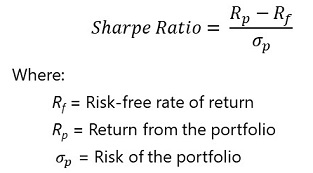

In [81]:
all_stock_stats['sharpe_ratio'] = (all_stock_stats.annualized_return_rate - 0.75)/all_stock_stats.annualized_volatility

In [82]:
all_stock_stats.sort_values('sharpe_ratio', ascending=False)

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate,sharpe_ratio
20,amzn,0.162296,40.898487,1.896614,30.107821,504.68777,1.33349
24,msft,0.139222,35.084018,1.753346,27.833508,371.486208,1.23355
19,aapl,0.131592,33.161069,1.872309,29.721976,322.741369,1.090475
18,unh,0.094462,23.804408,1.780371,28.262509,167.361278,0.815724
21,fb,0.105814,26.665121,2.034832,32.301949,187.960421,0.802277
22,goog,0.083719,21.097150,1.651418,26.215451,140.40963,0.776151
0,sp500,0.051864,13.069808,1.207533,19.168989,74.808459,0.642695
15,mrk,0.051051,12.864847,1.406138,22.321745,68.017012,0.542737
14,jnj,0.044861,11.305044,1.245428,19.770557,59.793934,0.533877
11,ms,0.057707,14.542055,2.180085,34.607776,53.492057,0.398525


<h3><b>Insight</b></h3><hr>

<b>The Top 10 Stocks having highest Sharpe Ratio excluding S&P500 are</b><br>
1.<em>AMZN</em> (1.33) <br>
2.<em>MSFT</em> (1.23) <br>
3.<em>AAPL</em> (1.09) <br>
4.<em>UNH</em> (0.81) <br>
5.<em>FB</em> (0.80) <br>
6.<em>GOOG</em> (0.77) <br>
7.<em>MRK</em> (0.54) <br>
8.<em>JNJ</em> (0.53) <br>
9.<em>MS</em> (0.40) <br>
10.<em>RHHBY</em> (0.32)


#### <b><font color='dodgerblue'>Calculating Beta Value</font></b>

In [83]:
returns_df.head()

,Date,sp500_pct_change,aal_pct_change,algt_pct_change,alk_pct_change,dal_pct_change,ha_pct_change,luv_pct_change,bcs_pct_change,cs_pct_change,db_pct_change,gs_pct_change,ms_pct_change,wfc_pct_change,bhc_pct_change,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,goog_pct_change,ibm_pct_change,msft_pct_change
1258,2015-10-01,0.001974,0.009529,0.008000,0.009818,0.012035,0.002026,0.009727,0.015562,0.002497,-0.016320,0.013006,0.000000,0.001753,0.006839,-0.001928,-0.000405,0.013690,0.008194,0.005172,-0.006528,0.017250,0.011680,0.004717,-0.009519,0.007908
1259,2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
1260,2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
1261,2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
1262,2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069


In [84]:
coef=[]
for x in returns_df.columns[1:]:
    x = np.array(returns_df[x]).reshape((-1,1))
    y = np.array(returns_df["sp500_pct_change"])
    model = LinearRegression().fit(x, y)
    coef.append(model.coef_)

beta = []
for i in coef:
    beta+=i.tolist() 


all_stock_stats['Beta'] = beta

In [85]:
all_stock_stats

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate,sharpe_ratio,Beta
0,sp500,0.051864,13.069808,1.207533,19.168989,74.808459,0.642695,1.000000
1,aal,-0.032828,-8.272605,3.471214,55.10381,-68.64796,-0.163738,0.166719
2,algt,-0.004069,-1.025274,2.909018,46.179222,-45.040827,-0.038443,0.226019
3,alk,-0.024774,-6.242962,2.689772,42.6988,-54.343762,-0.163774,0.260602
4,dal,0.005133,1.293620,2.64697,42.019352,-32.658005,0.012937,0.259471
5,ha,0.003582,0.902731,3.311861,52.574168,-47.877072,0.002905,0.166138
6,luv,0.025213,6.353628,2.290575,36.361749,-2.369175,0.154108,0.294129
7,bcs,-0.053558,-13.496564,2.511285,39.865406,-66.622252,-0.357367,0.293887
8,cs,-0.043439,-10.946640,2.283268,36.245755,-58.613533,-0.322704,0.366730
9,db,-0.054141,-13.643435,2.773542,44.028613,-68.325792,-0.326911,0.246715


#### <b><font color='dodgerblue'>Calculating Expected Returns</font></b>

![32a9df0e-ff2d-4a8b-8eb4-907fd60b8b62-Capstone_Project_DA_BA%20%28CAPM%29%20(1).jpg](attachment:32a9df0e-ff2d-4a8b-8eb4-907fd60b8b62-Capstone_Project_DA_BA%20%28CAPM%29%20(1).jpg)
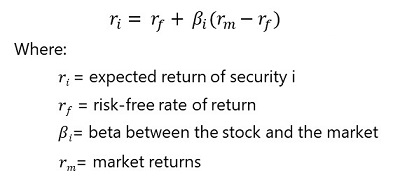

In [86]:
all_stock_stats['exp_returns'] = 0.75 + all_stock_stats.Beta * (all_stock_stats.annualized_return_rate - 0.75)

In [87]:
all_stock_stats.sort_values('exp_returns', ascending=False)

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate,sharpe_ratio,Beta,exp_returns
24,msft,0.139222,35.084018,1.753346,27.833508,371.486208,1.23355,0.569614,20.307126
19,aapl,0.131592,33.161069,1.872309,29.721976,322.741369,1.090475,0.484608,16.456656
20,amzn,0.162296,40.898487,1.896614,30.107821,504.68777,1.33349,0.378639,15.951796
0,sp500,0.051864,13.069808,1.207533,19.168989,74.808459,0.642695,1.000000,13.069808
22,goog,0.083719,21.097150,1.651418,26.215451,140.40963,0.776151,0.557907,12.101824
18,unh,0.094462,23.804408,1.780371,28.262509,167.361278,0.815724,0.472590,11.645281
21,fb,0.105814,26.665121,2.034832,32.301949,187.960421,0.802277,0.374316,10.450434
14,jnj,0.044861,11.305044,1.245428,19.770557,59.793934,0.533877,0.626970,7.367695
15,mrk,0.051051,12.864847,1.406138,22.321745,68.017012,0.542737,0.528221,7.149317
11,ms,0.057707,14.542055,2.180085,34.607776,53.492057,0.398525,0.448455,6.935122


<h3><b>Insight</b></h3><hr>

<b>The Top 10 Stocks having highest Expected Returns excluding S&P500 are</b><br>
1.<em>MSFT</em> (20.31%) <br>
2.<em>AAPL</em> (16.45%) <br>
3.<em>AMZN</em> (15.95%) <br>
4.<em>GOOG</em> (12.10%) <br>
5.<em>UNH</em> (11.64%) <br>
6.<em>FB</em> (10.45%) <br>
7.<em>JNJ</em> (7.36%) <br>
8.<em>MRK</em> (7.15%) <br>
9.<em>MS</em> (6.93%) <br>
10.<em>RHHBY</em> (4.17%)


<h3><b>Inference</b></h3><hr>

<b>The Top 12 Stocks having highest Annualized Return Rate and Expected Returns with low to medium volatility excluding S&P500 are</b><br>

<em><b>Technology Sector</b></em>

* <em>AMZN</em>
* <em>MSFT</em> 
* <em>AAPL</em> 
* <em>FB</em>  
* <em>GOOG</em> 

<em><b>Finance Sector</b></em>

* <em>MS</em>  
* <em>GS</em> 

<em><b>Pharma_Healthcare Sector</b></em>

* <em>UNH</em>  
* <em>MRK</em>  
* <em>JNJ</em>
* <em>RHHBY</em>
* <em>PFE</em> <br>

`Using these stocks to create 2 portfolios with different attributes`

<h2><b>Exporting Final Datasets</b></h2>

In [88]:
close_price_df.to_csv('daily_closing_price.csv', index=False)
normalized_close_price.to_csv('normalized_closing _price.csv', index=False)
volume_df.to_csv('daily_volume.csv', index=False)
returns_df.to_csv('daily_pct_change.csv', index=False)
RSI_df.to_csv('daily_RSI.csv', index=False)
all_stock_stats.to_csv('AllStocks_derived_metrics.csv', index=False)

<h2><b>Creating Portfolios</b></h2>

#### <b><font color='salmon'>Peter wants to invest total 1,000,000 dollars and Patrik a total of 500,000 dollars with equal weightage to each stock in their portfolio</font></b>

In [89]:
# filtering the all_stocks_stats dataframe and keeping only the top 12 stocks
top_stocks = all_stock_stats[all_stock_stats.stock.isin(['amzn','msft','aapl','fb','unh','goog','ms','mrk','jnj','gs','rhhby','pfe'])]   

In [90]:
top_stocks.sort_values('annualized_return_rate', ascending=False, inplace=True)
top_stocks = top_stocks.reset_index().drop(columns=['index'], axis=1)

In [91]:
top_stocks

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate,sharpe_ratio,Beta,exp_returns
0,amzn,0.162296,40.898487,1.896614,30.107821,504.68777,1.33349,0.378639,15.951796
1,msft,0.139222,35.084018,1.753346,27.833508,371.486208,1.23355,0.569614,20.307126
2,aapl,0.131592,33.161069,1.872309,29.721976,322.741369,1.090475,0.484608,16.456656
3,fb,0.105814,26.665121,2.034832,32.301949,187.960421,0.802277,0.374316,10.450434
4,unh,0.094462,23.804408,1.780371,28.262509,167.361278,0.815724,0.472590,11.645281
5,goog,0.083719,21.097150,1.651418,26.215451,140.40963,0.776151,0.557907,12.101824
6,ms,0.057707,14.542055,2.180085,34.607776,53.492057,0.398525,0.448455,6.935122
7,mrk,0.051051,12.864847,1.406138,22.321745,68.017012,0.542737,0.528221,7.149317
8,jnj,0.044861,11.305044,1.245428,19.770557,59.793934,0.533877,0.626970,7.367695
9,gs,0.031343,7.898465,1.989431,31.581242,14.174524,0.226352,0.478402,4.169838


#### <b><font color='dodgerblue'>Creating a High Return High Risk Portfolio for <u>Peter Jyengar</u></font></b>

###### 1st Portfolio - with 5 stocks

In [92]:
# selecting top 5 stocks from above top_stocks dataframe
top5 = top_stocks.stock[top_stocks.stock.isin(['amzn', 'msft', 'aapl','unh','ms'])]
top5

0    amzn
1    msft
2    aapl
4     unh
6      ms
Name: stock, dtype: object

In [93]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top5+'_pct_change') | (returns_df.columns=='Date')]]

In [94]:
portfolio_returns.head()

,Date,ms_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,msft_pct_change
1258,2015-10-01,0.000000,0.005172,-0.006528,0.017250,0.007908
1259,2015-10-02,-0.002222,0.019038,0.007301,0.022699,0.021520
1260,2015-10-05,0.027362,0.006901,0.003624,0.020919,0.023261
1261,2015-10-06,0.002168,-0.030088,0.004784,-0.011404,0.002573
1262,2015-10-07,0.017614,0.003274,-0.004761,0.008298,0.001069


In [95]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_peter = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_peter['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [96]:
# calculaing returns if we had invested $1 Mil dollars equally in 2015
investment = 200000                     
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [97]:
portfolio_returns.head()

,Date,ms_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,msft_pct_change
1258,2015-10-01,200000.000000,201034.391845,198694.462423,203449.942660,201581.577116
1259,2015-10-02,199555.555556,204861.649774,200145.044419,208068.124947,205919.575505
1260,2015-10-05,205015.879365,206275.320985,200870.346297,212420.628287,210709.458234
1261,2015-10-06,205460.323810,200068.961295,201831.354421,209998.227842,211251.704078
1262,2015-10-07,209079.365079,200724.072050,200870.346297,211740.798265,211477.637211


In [98]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_peter['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top5)].annualized_return_rate.values

annual_returns = portfolio_peter.annualized_return_rate      # annual_return_rate of each selected stock
investment = 200000      # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_peter[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_peter.insert(3,'avg_annual_returns',portfolio_peter[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [99]:
portfolio_peter

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,ms,0.057707,14.542055,306125.109553,229084.110898,262397.649329,300555.660991,344262.631867,3.943255e+05
1,unh,0.094462,23.804408,397052.892690,247608.816831,306550.630862,379523.195032,469866.446409,5.817154e+05
2,aapl,0.131592,33.161069,511880.984429,266322.137081,354637.403497,472238.955942,628838.439797,8.373680e+05
3,amzn,0.162296,40.898487,627424.648698,281796.973930,397047.672579,559434.163193,788234.271503,1.110610e+06
4,msft,0.139222,35.084018,538734.709926,270168.036544,364953.839851,492994.311709,665956.526110,8.996008e+05


In [100]:
# Total returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)

2823619.8525290424

In [101]:
# Pecentage returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)/1000000 * 100

282.3619852529042

###### 2nd Portfolio - with 6 stocks

In [102]:
# selecting top 6 stocks from above top_stocks dataframe
top6 = top_stocks.stock[top_stocks.stock.isin(['amzn', 'msft', 'aapl','unh','fb','mrk'])]
top6

0    amzn
1    msft
2    aapl
3      fb
4     unh
7     mrk
Name: stock, dtype: object

In [103]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top6+'_pct_change') | (returns_df.columns=='Date')]]

In [104]:
portfolio_returns.head()

,Date,mrk_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,msft_pct_change
1258,2015-10-01,-0.000405,0.005172,-0.006528,0.017250,0.011680,0.007908
1259,2015-10-02,0.015597,0.019038,0.007301,0.022699,0.012314,0.021520
1260,2015-10-05,0.021739,0.006901,0.003624,0.020919,0.021071,0.023261
1261,2015-10-06,-0.027913,-0.030088,0.004784,-0.011404,-0.012871,0.002573
1262,2015-10-07,0.023092,0.003274,-0.004761,0.008298,-0.004310,0.001069


In [105]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_peter = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_peter['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [106]:
# calculaing returns if we had invested $1 Mil dollars equally in 2015
investment = 1000000/6                    
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [107]:
portfolio_returns.head()

,Date,mrk_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,msft_pct_change
1258,2015-10-01,166599.176620,167528.659871,165578.718686,169541.618883,168613.264695,167984.647597
1259,2015-10-02,169197.543414,170718.041478,166787.537016,173390.104122,170689.651375,171599.646254
1260,2015-10-05,172875.754327,171896.100821,167391.955247,177017.190239,174286.243805,175591.215195
1261,2015-10-06,168050.212622,166724.134413,168192.795351,174998.523202,172043.012487,176043.086732
1262,2015-10-07,171930.897049,167270.060042,167391.955247,176450.665221,171301.445948,176231.364342


In [108]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_peter['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top6)].annualized_return_rate.values

annual_returns = portfolio_peter.annualized_return_rate      # annual_return_rate of each selected stock
investment = 1000000/6     # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_peter[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_peter.insert(3,'avg_annual_returns',portfolio_peter[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [109]:
portfolio_peter

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,mrk,0.051051,12.864847,243145.070459,188108.077838,212307.893688,239620.978749,270447.850333,305240.551689
1,unh,0.094462,23.804408,330877.410575,206340.680692,255458.859051,316269.329193,391555.372007,484762.811932
2,aapl,0.131592,33.161069,426567.487024,221935.114234,295531.169581,393532.463285,524032.033164,697806.654856
3,amzn,0.162296,40.898487,522853.873915,234830.811608,330873.060483,466195.135994,656861.892919,925508.468572
4,fb,0.105814,26.665121,357930.079245,211108.535523,267400.882623,338703.652368,429019.392166,543417.933546
5,msft,0.139222,35.084018,448945.591605,225140.030454,304128.199876,410828.593091,554963.771758,749667.362846


In [110]:
# Total returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)

2706403.783440945

In [111]:
# Pecentage returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)/1000000 * 100

270.64037834409453

###### 3rd Portfolio - with 7 stocks

In [112]:
# selecting top 7 stocks from above top_stocks dataframe
top7 = top_stocks.stock[top_stocks.stock.isin(['amzn', 'msft', 'aapl','fb','unh','mrk','ms'])]
top7

0    amzn
1    msft
2    aapl
3      fb
4     unh
6      ms
7     mrk
Name: stock, dtype: object

In [113]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top7+'_pct_change') | (returns_df.columns=='Date')]]

In [114]:
portfolio_returns.head()

,Date,ms_pct_change,mrk_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,msft_pct_change
1258,2015-10-01,0.000000,-0.000405,0.005172,-0.006528,0.017250,0.011680,0.007908
1259,2015-10-02,-0.002222,0.015597,0.019038,0.007301,0.022699,0.012314,0.021520
1260,2015-10-05,0.027362,0.021739,0.006901,0.003624,0.020919,0.021071,0.023261
1261,2015-10-06,0.002168,-0.027913,-0.030088,0.004784,-0.011404,-0.012871,0.002573
1262,2015-10-07,0.017614,0.023092,0.003274,-0.004761,0.008298,-0.004310,0.001069


In [115]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_peter = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_peter['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [116]:
# calculaing returns if we had invested $1 Mil dollars equally in 2015
investment = 1000000/7                    
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [117]:
portfolio_returns.head()

,Date,ms_pct_change,mrk_pct_change,unh_pct_change,aapl_pct_change,amzn_pct_change,fb_pct_change,msft_pct_change
1258,2015-10-01,142857.142857,142799.294246,143595.994175,141924.616016,145321.387614,144525.655453,143986.840797
1259,2015-10-02,142539.682540,145026.465783,146329.749839,142960.746014,148620.089248,146305.415464,147085.411075
1260,2015-10-05,146439.913832,148179.217995,147339.514989,143478.818783,151729.020205,149388.208976,150506.755881
1261,2015-10-06,146757.374150,144043.039390,142906.400925,144165.253158,149998.734173,147465.439275,150894.074342
1262,2015-10-07,149342.403628,147369.340328,143374.337179,143478.818783,151243.427332,146829.810813,151055.455151


In [118]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_peter['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top7)].annualized_return_rate.values

annual_returns = portfolio_peter.annualized_return_rate      # annual_return_rate of each selected stock
investment = 1000000/7     # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_peter[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_peter.insert(3,'avg_annual_returns',portfolio_peter[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [119]:
portfolio_peter

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,ms,0.057707,14.542055,218660.792538,163631.507784,187426.892378,214682.614993,245901.879905,281661.067630
1,mrk,0.051051,12.864847,208410.060394,161235.495290,181978.194590,205389.410356,231812.443142,261634.758591
2,unh,0.094462,23.804408,283609.209064,176863.440593,218964.736330,271087.996451,335618.890292,415510.981656
3,aapl,0.131592,33.161069,365629.274592,190230.097915,253312.431070,337313.539958,449170.314141,598119.989877
4,amzn,0.162296,40.898487,448160.463356,201283.552807,283605.480414,399595.830852,563024.479645,793292.973061
5,fb,0.105814,26.665121,306797.210782,180950.173305,229200.756534,290317.416316,367730.907571,465786.800182
6,msft,0.139222,35.084018,384810.507090,192977.168960,260681.314179,352138.794078,475683.232936,642572.025296


In [120]:
# Total returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)

2458578.596293901

In [121]:
# Pecentage returns after 5 years
(portfolio_peter['5yr_returns'].sum() - 1000000)/1000000 * 100

245.8578596293901

###### <b>Considering 3rd portfolio as it's giving the high returns with 7 stocks in the portfolio while keeping the portfolio diversified</b>

<b><font color='dodgerblue'><u>Peter's Portfolio</u></font></b><br>
<em><b>Technology Sector</b></em>

* <em>AMZN</em>
* <em>MSFT</em> 
* <em>AAPL</em> 
* <em>FB</em> 
 

<em><b>Finance Sector</b></em>

* <em>MS</em>  
 

<em><b>Pharma_Healthcare Sector</b></em>

* <em>UNH</em>  
* <em>MRK</em>


#### <b><font color='dodgerblue'>Creating a Good Return Low Risk Portfolio for <u>Patrik Jyengar</u></font></b>

In [122]:
top_stocks = top_stocks.sort_values('annualized_volatility').reset_index()
top_stocks.drop(columns='index', axis = 1, inplace=True)

In [123]:
top_stocks

,stock,avg_daily_returns,annualized_return_rate,daily_volatility,annualized_volatility,cummulative_return_rate,sharpe_ratio,Beta,exp_returns
0,jnj,0.044861,11.305044,1.245428,19.770557,59.793934,0.533877,0.626970,7.367695
1,rhhby,0.029899,7.534502,1.351058,21.447381,28.868151,0.316332,0.504988,4.176093
2,pfe,0.021923,5.524649,1.382586,21.947874,15.263822,0.217545,0.544939,3.351892
3,mrk,0.051051,12.864847,1.406138,22.321745,68.017012,0.542737,0.528221,7.149317
4,goog,0.083719,21.097150,1.651418,26.215451,140.40963,0.776151,0.557907,12.101824
5,msft,0.139222,35.084018,1.753346,27.833508,371.486208,1.23355,0.569614,20.307126
6,unh,0.094462,23.804408,1.780371,28.262509,167.361278,0.815724,0.472590,11.645281
7,aapl,0.131592,33.161069,1.872309,29.721976,322.741369,1.090475,0.484608,16.456656
8,amzn,0.162296,40.898487,1.896614,30.107821,504.68777,1.33349,0.378639,15.951796
9,gs,0.031343,7.898465,1.989431,31.581242,14.174524,0.226352,0.478402,4.169838


###### 1st Portfolio - with 7 stocks

In [124]:
# selecting top 7 low risk stocks from above top_stocks 
top7 = top_stocks.stock[top_stocks.stock.isin(['jnj', 'rhhby', 'pfe','goog','mrk','msft','unh'])]
top7

0      jnj
1    rhhby
2      pfe
3      mrk
4     goog
5     msft
6      unh
Name: stock, dtype: object

In [125]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top7+'_pct_change') | (returns_df.columns=='Date')]]

In [126]:
portfolio_returns.head()

,Date,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,-0.001928,-0.000405,0.013690,0.008194,0.005172,0.004717,0.007908
1259,2015-10-02,0.008157,0.015597,0.038945,0.003010,0.019038,0.025553,0.021520
1260,2015-10-05,0.008836,0.021739,0.012092,0.003601,0.006901,0.023225,0.023261
1261,2015-10-06,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.006189,0.002573
1262,2015-10-07,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004772,0.001069


In [127]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_patrik = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_patrik['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [128]:
# calculaing returns if we had invested $500k dollars equally in 2015
investment = 500000/7                    
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [129]:
portfolio_returns.head()

,Date,jnj_pct_change,mrk_pct_change,pfe_pct_change,rhhby_pct_change,unh_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,71290.840918,71399.647123,72406.421977,72013.873817,71797.997087,71765.509150,71993.420399
1259,2015-10-02,71872.371270,72513.232892,75226.274617,72230.650312,73164.874919,73599.298243,73542.705537
1260,2015-10-05,72507.463486,74089.608997,76135.898485,72490.782539,73669.757495,75308.643574,75253.377941
1261,2015-10-06,71482.133294,72021.519695,74566.791741,72685.883335,71453.200463,75774.725640,75447.037171
1262,2015-10-07,72675.801542,73684.670164,75703.827262,70561.452443,71687.168589,75413.131313,75527.727575


In [130]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_patrik['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top7)].annualized_return_rate.values

annual_returns = portfolio_patrik.annualized_return_rate      # annual_return_rate of each selected stock
investment = 500000/7     # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_patrik[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_patrik.insert(3,'avg_annual_returns',portfolio_patrik[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [131]:
portfolio_patrik

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,jnj,0.044861,11.305044,99629.079224,79503.602706,88491.519805,98495.524869,109630.487085,122024.261655
1,mrk,0.051051,12.864847,104205.030197,80617.747645,90989.097295,102694.705178,115906.221571,130817.379295
2,pfe,0.021923,5.524649,84176.095164,75374.749615,79538.940313,83933.187951,88570.202366,93463.395574
3,rhhby,0.029899,7.534502,89290.349017,76810.358729,82597.636914,88820.957702,95513.174733,102709.617005
4,unh,0.094462,23.804408,141804.604532,88431.720297,109482.368165,135543.998226,167809.445146,207755.490828
5,goog,0.083719,21.097150,131541.544302,86497.964322,104746.569646,126845.110617,153605.813936,186012.262989
6,msft,0.139222,35.084018,192405.253545,96488.584480,130340.657090,176069.397039,237841.616468,321286.012648


In [132]:
# Total returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)

664068.4199950467

In [133]:
# Pecentage returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)/500000 * 100

132.81368399900936

###### 2nd Portfolio - with 7 stocks

In [134]:
# selecting top 7 stocks with low to moderate risk from top_stocks dataframe
top7 = top_stocks.stock[top_stocks.stock.isin(['jnj', 'rhhby', 'amzn','goog','ms','msft','unh'])]
top7

0       jnj
1     rhhby
4      goog
5      msft
6       unh
8      amzn
11       ms
Name: stock, dtype: object

In [135]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top7+'_pct_change') | (returns_df.columns=='Date')]]

In [136]:
portfolio_returns.head()

,Date,ms_pct_change,jnj_pct_change,rhhby_pct_change,unh_pct_change,amzn_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,0.000000,-0.001928,0.008194,0.005172,0.017250,0.004717,0.007908
1259,2015-10-02,-0.002222,0.008157,0.003010,0.019038,0.022699,0.025553,0.021520
1260,2015-10-05,0.027362,0.008836,0.003601,0.006901,0.020919,0.023225,0.023261
1261,2015-10-06,0.002168,-0.014141,0.002691,-0.030088,-0.011404,0.006189,0.002573
1262,2015-10-07,0.017614,0.016699,-0.029228,0.003274,0.008298,-0.004772,0.001069


In [137]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_patrik = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_patrik['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [138]:
# calculaing returns if we had invested $500k dollars equally in 2015
investment = 500000/7                    
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [139]:
portfolio_returns.head()

,Date,ms_pct_change,jnj_pct_change,rhhby_pct_change,unh_pct_change,amzn_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,71428.571429,71290.840918,72013.873817,71797.997087,72660.693807,71765.509150,71993.420399
1259,2015-10-02,71269.841270,71872.371270,72230.650312,73164.874919,74310.044624,73599.298243,73542.705537
1260,2015-10-05,73219.956916,72507.463486,72490.782539,73669.757495,75864.510102,75308.643574,75253.377941
1261,2015-10-06,73378.687075,71482.133294,72685.883335,71453.200463,74999.367086,75774.725640,75447.037171
1262,2015-10-07,74671.201814,72675.801542,70561.452443,71687.168589,75621.713666,75413.131313,75527.727575


In [140]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_patrik['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top7)].annualized_return_rate.values

annual_returns = portfolio_patrik.annualized_return_rate      # annual_return_rate of each selected stock
investment = 500000/7     # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_patrik[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_patrik.insert(3,'avg_annual_returns',portfolio_patrik[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [141]:
portfolio_patrik

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,ms,0.057707,14.542055,109330.396269,81815.753892,93713.446189,107341.307497,122950.939952,140830.533815
1,jnj,0.044861,11.305044,99629.079224,79503.602706,88491.519805,98495.524869,109630.487085,122024.261655
2,rhhby,0.029899,7.534502,89290.349017,76810.358729,82597.636914,88820.957702,95513.174733,102709.617005
3,unh,0.094462,23.804408,141804.604532,88431.720297,109482.368165,135543.998226,167809.445146,207755.490828
4,amzn,0.162296,40.898487,224080.231678,100641.776403,141802.740207,199797.915426,281512.239823,396646.486531
5,goog,0.083719,21.097150,131541.544302,86497.964322,104746.569646,126845.110617,153605.813936,186012.262989
6,msft,0.139222,35.084018,192405.253545,96488.584480,130340.657090,176069.397039,237841.616468,321286.012648


In [142]:
# Total returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)

977264.6654714774

In [143]:
# Pecentage returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)/500000 * 100

195.45293309429547

###### 3rd Portfolio - with 8 stocks

In [144]:
# selecting top 8 stocks with low to moderate risk from top_stocks dataframe
top8 = top_stocks.stock[top_stocks.stock.isin(['jnj', 'rhhby', 'goog','aapl','mrk','msft','unh','ms'])]
top8

0       jnj
1     rhhby
3       mrk
4      goog
5      msft
6       unh
7      aapl
11       ms
Name: stock, dtype: object

In [145]:
# making subset dataframe of returns_df with only the selected stocks
portfolio_returns = returns_df[returns_df.columns[returns_df.columns.isin(top8+'_pct_change') | (returns_df.columns=='Date')]]

In [146]:
portfolio_returns.head()

,Date,ms_pct_change,jnj_pct_change,mrk_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,0.000000,-0.001928,-0.000405,0.008194,0.005172,-0.006528,0.004717,0.007908
1259,2015-10-02,-0.002222,0.008157,0.015597,0.003010,0.019038,0.007301,0.025553,0.021520
1260,2015-10-05,0.027362,0.008836,0.021739,0.003601,0.006901,0.003624,0.023225,0.023261
1261,2015-10-06,0.002168,-0.014141,-0.027913,0.002691,-0.030088,0.004784,0.006189,0.002573
1262,2015-10-07,0.017614,0.016699,0.023092,-0.029228,0.003274,-0.004761,-0.004772,0.001069


In [147]:
# creating a dataframe containing derived metrics and daily/annual returns for selected stocks
portfolio_patrik = pd.DataFrame({'stock':[i[:i.find('_')] for i in portfolio_returns.columns.values[1:]]}) # creating df containg 1st column as 'stock' containing selected stocks                
portfolio_patrik['avg_daily_returns%'] = (portfolio_returns.mean().values*100)     # stock daily return %

In [148]:
# calculaing returns if we had invested $500k dollars equally in 2015
investment = 500000/8                    
for i in range(len(portfolio_returns)):     
    return_percnt = portfolio_returns.iloc[i,1:]
    investment += investment*return_percnt           # multiplying initial investment with 1st day return percentage then updating invested amount and again performing same calculation
    portfolio_returns.iloc[i,1:] = investment

In [149]:
portfolio_returns.head()

,Date,ms_pct_change,jnj_pct_change,mrk_pct_change,rhhby_pct_change,unh_pct_change,aapl_pct_change,goog_pct_change,msft_pct_change
1258,2015-10-01,62500.000000,62379.485804,62474.691233,63012.139590,62823.247452,62092.019507,62794.820506,62994.242849
1259,2015-10-02,62361.111111,62888.324861,63449.078780,63201.819023,64019.265554,62545.326381,64399.385962,64349.867345
1260,2015-10-05,64067.462302,63444.030550,64828.407873,63429.434721,64461.037808,62771.983218,65895.063127,65846.705698
1261,2015-10-06,64206.351190,62546.866632,63018.829733,63600.147918,62521.550405,63072.298257,66302.884935,66016.157524
1262,2015-10-07,65337.301587,63591.326349,64474.086393,61741.270888,62726.272516,62771.983218,65986.489899,66086.761628


In [150]:
# adding extra metrics in portfolio dataframe
# annualized return rate is same as was in the original derived_metrics dataframe
portfolio_patrik['annualized_return_rate'] = all_stock_stats[all_stock_stats.stock.isin(top8)].annualized_return_rate.values

annual_returns = portfolio_patrik.annualized_return_rate      # annual_return_rate of each selected stock
investment = 500000/8     # initial investment
for i in range(5):
    investment += investment*annual_returns/100      
    portfolio_patrik[str(i+1)+'yr_returns'] = investment.values    # saving return amount for 1st to 5th year

# inserting avg_annual_returns in 4th column which is average of 5 years returns 
portfolio_patrik.insert(3,'avg_annual_returns',portfolio_patrik[[str(i+1)+'yr_returns' for i in range(5)]].sum(axis=1)/5)



In [151]:
portfolio_patrik

,stock,avg_daily_returns%,annualized_return_rate,avg_annual_returns,1yr_returns,2yr_returns,3yr_returns,4yr_returns,5yr_returns
0,ms,0.057707,14.542055,95664.096735,71588.784656,81999.265415,93923.644060,107582.072458,123226.717088
1,jnj,0.044861,11.305044,87175.444321,69565.652368,77430.079830,86183.584260,95926.676199,106771.228948
2,mrk,0.051051,12.864847,91179.401422,70540.529189,79615.460133,89857.867031,101417.943875,114465.206884
3,rhhby,0.029899,7.534502,78129.055390,67209.063888,72272.932300,77718.337989,83574.027892,89870.914879
4,unh,0.094462,23.804408,124079.028966,77377.755260,95797.072144,118600.998447,146833.264503,181786.054475
5,aapl,0.131592,33.161069,159962.807634,83225.667838,110824.188593,147574.673732,196512.012437,261677.495571
6,goog,0.083719,21.097150,115098.851264,75685.718782,91653.248440,110989.471790,134405.087194,162760.730116
7,msft,0.139222,35.084018,168354.596852,84427.511420,114048.074953,154060.722409,208111.414409,281125.261067


In [152]:
# Total returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)

821683.6090278435

In [153]:
# Pecentage returns after 5 years
(portfolio_patrik['5yr_returns'].sum() - 500000)/500000 * 100

164.3367218055687

###### <b>Considering 3rd portfolio as it's giving the high returns with 8 low to moderate risk stocks in the portfolio while keeping the portfolio diversified</b>

<b><font color='dodgerblue'><u>Patriks's Portfolio</u></font></b><br>
<em><b>Technology Sector</b></em>

* <em>AMZN</em>
* <em>MSFT</em> 
* <em>GOOG</em>  

<em><b>Finance Sector</b></em>

* <em>MS</em> 
 

<em><b>Pharma_Healthcare Sector</b></em>

* <em>UNH</em> 
* <em>RHHBY</em> 
* <em>JNJ</em> 
* <em>MRK</em>



# <b>Finalized Portfolios</b>

<h3><font color='dodgerblue'><b>Peter Jyengar</b></font></h3>

<b>High Risk High Return Portfolio</b><br><br>
1.AMZN <br>
2.MSFT <br>
3.AAPL <br>
4.FB  <br>
5.MS <br>
6.UNH  <br>
7.MRK  <br>


Equally investing 1 Million in each stock we get a total return of 3,458,578 dollars with a profit of 2,458,578 dollars which gives us a profit of 245.85 %

<hr>

<h3><font color='dodgerblue'><b>Patrik Jyengar</b></font></h3>

<b>Low Risk Good Return Portfolio</b><br><br>
1.MSFT <br>
2.AMZN <br>
3.GOOG <br>
4.MS <br>
5.UNH <br>
6.RHHBY <br>
7.JNJ <br>
8.MRK <br>

Equally investing 500k in each stock we get a total return of 1,321,683 dollars with a profit of 821,683 dollars which gives us a 164.34 % profit